# EDA US Stocks 2020-2024

## Brief Introduction to The Stock Market

### Stocks and Assets

In [2]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
from sklearn.impute import KNNImputer

stocks = pd.read_csv("US Stock Market Dataset.csv")
stocks.head()

,Unnamed: 0,Date,Natural_Gas_Price,Natural_Gas_Vol.,Crude_oil_Price,Crude_oil_Vol.,Copper_Price,Copper_Vol.,Bitcoin_Price,Bitcoin_Vol.,...,Berkshire_Price,Berkshire_Vol.,Netflix_Price,Netflix_Vol.,Amazon_Price,Amazon_Vol.,Meta_Price,Meta_Vol.,Gold_Price,Gold_Vol.
0,0,2/2/2024,2.079,NaN,72.28,NaN,3.8215,NaN,"43,194.70",42650,...,"5,89,498",10580,564.64,4030000,171.81,117220000,474.99,84710000,"2,053.70",NaN
1,1,1/2/2024,2.050,161340.0,73.82,577940.0,3.8535,NaN,"43,081.40",47690,...,"5,81,600",9780,567.51,3150000,159.28,66360000,394.78,25140000,"2,071.10",260920.0
2,2,31-01-2024,2.100,142860.0,75.85,344490.0,3.9060,NaN,"42,580.50",56480,...,"5,78,020",9720,564.11,4830000,155.20,49690000,390.14,20010000,"2,067.40",238370.0
3,3,30-01-2024,2.077,139750.0,77.82,347240.0,3.9110,NaN,"42,946.20",55130,...,"5,84,680",9750,562.85,6120000,159.00,42290000,400.06,18610000,"2,050.90",214590.0
4,4,29-01-2024,2.490,3590.0,76.78,331930.0,3.8790,NaN,"43,299.80",45230,...,"5,78,800",13850,575.79,6880000,161.26,42840000,401.02,17790000,"2,034.90",1780.0


In [3]:
pd.options.display.max_rows = 1000
pd.options.display.max_columns = 20

## Data Cleaning

Data cleaning, in our case, is a process to observe incomplete or corrupted data and provide solutions to fix the dataset. This approach doesn't alter existing data, but tries to use various methods to fill in missing data while retaining the overall integrity of dataset.

In [4]:
#output basic info on the dataset
stocks.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1013 entries, 0 to 1012
Data columns (total 39 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Unnamed: 0         1013 non-null   int64  
 1   Date               1013 non-null   object 
 2   Natural_Gas_Price  1013 non-null   float64
 3   Natural_Gas_Vol.   1009 non-null   float64
 4   Crude_oil_Price    1013 non-null   float64
 5   Crude_oil_Vol.     990 non-null    float64
 6   Copper_Price       1013 non-null   float64
 7   Copper_Vol.        976 non-null    float64
 8   Bitcoin_Price      1013 non-null   object 
 9   Bitcoin_Vol.       1013 non-null   int64  
 10  Platinum_Price     1013 non-null   object 
 11  Platinum_Vol.      636 non-null    float64
 12  Ethereum_Price     1013 non-null   object 
 13  Ethereum_Vol.      1013 non-null   int64  
 14  S&P_500_Price      1013 non-null   object 
 15  Nasdaq_100_Price   1013 non-null   object 
 16  Nasdaq_100_Vol.    1012 

### 更改日期格式

In [5]:

stocks['Date'] = pd.to_datetime(stocks['Date'], dayfirst=True, errors='coerce')

stocks['Date'] = stocks['Date'].dt.strftime('%d-%m-%Y')
print(stocks['Date'])

0       02-02-2024
1       01-02-2024
2       31-01-2024
3       30-01-2024
4       29-01-2024
           ...    
1008    08-01-2020
1009    07-01-2020
1010    06-01-2020
1011    03-01-2020
1012    02-01-2020
Name: Date, Length: 1013, dtype: object


In [6]:
stocks.head()

,Unnamed: 0,Date,Natural_Gas_Price,Natural_Gas_Vol.,Crude_oil_Price,Crude_oil_Vol.,Copper_Price,Copper_Vol.,Bitcoin_Price,Bitcoin_Vol.,...,Berkshire_Price,Berkshire_Vol.,Netflix_Price,Netflix_Vol.,Amazon_Price,Amazon_Vol.,Meta_Price,Meta_Vol.,Gold_Price,Gold_Vol.
0,0,02-02-2024,2.079,NaN,72.28,NaN,3.8215,NaN,"43,194.70",42650,...,"5,89,498",10580,564.64,4030000,171.81,117220000,474.99,84710000,"2,053.70",NaN
1,1,01-02-2024,2.050,161340.0,73.82,577940.0,3.8535,NaN,"43,081.40",47690,...,"5,81,600",9780,567.51,3150000,159.28,66360000,394.78,25140000,"2,071.10",260920.0
2,2,31-01-2024,2.100,142860.0,75.85,344490.0,3.9060,NaN,"42,580.50",56480,...,"5,78,020",9720,564.11,4830000,155.20,49690000,390.14,20010000,"2,067.40",238370.0
3,3,30-01-2024,2.077,139750.0,77.82,347240.0,3.9110,NaN,"42,946.20",55130,...,"5,84,680",9750,562.85,6120000,159.00,42290000,400.06,18610000,"2,050.90",214590.0
4,4,29-01-2024,2.490,3590.0,76.78,331930.0,3.8790,NaN,"43,299.80",45230,...,"5,78,800",13850,575.79,6880000,161.26,42840000,401.02,17790000,"2,034.90",1780.0


From the summary of the dataset, there is an error where all of the columns are supposed to be numerical, but some are labelled as categorical data. We attempt to debug this by changing the data types manually.

In [7]:
def remove_comma(str): #43,194.70 format
    return str.replace(",", "")

for col in stocks.columns:
    if stocks[col].dtypes == "object" and col != 'Date':
        stocks[col] = stocks[col].apply(remove_comma)
        stocks[col] = pd.to_numeric(stocks[col]) #changing categorical labels to numerical

stocks.info()
stocks.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1013 entries, 0 to 1012
Data columns (total 39 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Unnamed: 0         1013 non-null   int64  
 1   Date               1013 non-null   object 
 2   Natural_Gas_Price  1013 non-null   float64
 3   Natural_Gas_Vol.   1009 non-null   float64
 4   Crude_oil_Price    1013 non-null   float64
 5   Crude_oil_Vol.     990 non-null    float64
 6   Copper_Price       1013 non-null   float64
 7   Copper_Vol.        976 non-null    float64
 8   Bitcoin_Price      1013 non-null   float64
 9   Bitcoin_Vol.       1013 non-null   int64  
 10  Platinum_Price     1013 non-null   float64
 11  Platinum_Vol.      636 non-null    float64
 12  Ethereum_Price     1013 non-null   float64
 13  Ethereum_Vol.      1013 non-null   int64  
 14  S&P_500_Price      1013 non-null   float64
 15  Nasdaq_100_Price   1013 non-null   float64
 16  Nasdaq_100_Vol.    1012 

,Unnamed: 0,Date,Natural_Gas_Price,Natural_Gas_Vol.,Crude_oil_Price,Crude_oil_Vol.,Copper_Price,Copper_Vol.,Bitcoin_Price,Bitcoin_Vol.,...,Berkshire_Price,Berkshire_Vol.,Netflix_Price,Netflix_Vol.,Amazon_Price,Amazon_Vol.,Meta_Price,Meta_Vol.,Gold_Price,Gold_Vol.
0,0,02-02-2024,2.079,NaN,72.28,NaN,3.8215,NaN,43194.7,42650,...,589498,10580,564.64,4030000,171.81,117220000,474.99,84710000,2053.7,NaN
1,1,01-02-2024,2.050,161340.0,73.82,577940.0,3.8535,NaN,43081.4,47690,...,581600,9780,567.51,3150000,159.28,66360000,394.78,25140000,2071.1,260920.0
2,2,31-01-2024,2.100,142860.0,75.85,344490.0,3.9060,NaN,42580.5,56480,...,578020,9720,564.11,4830000,155.20,49690000,390.14,20010000,2067.4,238370.0
3,3,30-01-2024,2.077,139750.0,77.82,347240.0,3.9110,NaN,42946.2,55130,...,584680,9750,562.85,6120000,159.00,42290000,400.06,18610000,2050.9,214590.0
4,4,29-01-2024,2.490,3590.0,76.78,331930.0,3.8790,NaN,43299.8,45230,...,578800,13850,575.79,6880000,161.26,42840000,401.02,17790000,2034.9,1780.0


Normally this practice is not encouraged when working with data that includes actual categorical data, we implemented this approach because we are highly aware that the dataset composes of numerical data only. `Date` will remain as `object` so that after we performed KNN imputation we are able to merge. There are 1013 samples from the population. We chose to sample 70% of the dataset as the training set for our model. The rest of the 30% will be tested against our trained data to determine the model's predictability.

Unnamed: 0             0
Date                   0
Natural_Gas_Price      0
Natural_Gas_Vol.       4
Crude_oil_Price        0
Crude_oil_Vol.        23
Copper_Price           0
Copper_Vol.           37
Bitcoin_Price          0
Bitcoin_Vol.           0
Platinum_Price         0
Platinum_Vol.        377
Ethereum_Price         0
Ethereum_Vol.          0
S&P_500_Price          0
Nasdaq_100_Price       0
Nasdaq_100_Vol.        1
Apple_Price            0
Apple_Vol.             0
Tesla_Price            0
Tesla_Vol.             0
Microsoft_Price        0
Microsoft_Vol.         0
Silver_Price           0
Silver_Vol.           46
Google_Price           0
Google_Vol.            0
Nvidia_Price           0
Nvidia_Vol.            0
Berkshire_Price        0
Berkshire_Vol.         0
Netflix_Price          0
Netflix_Vol.           0
Amazon_Price           0
Amazon_Vol.            0
Meta_Price             0
Meta_Vol.              0
Gold_Price             0
Gold_Vol.              2
dtype: int64


((7,), <Axes: >)

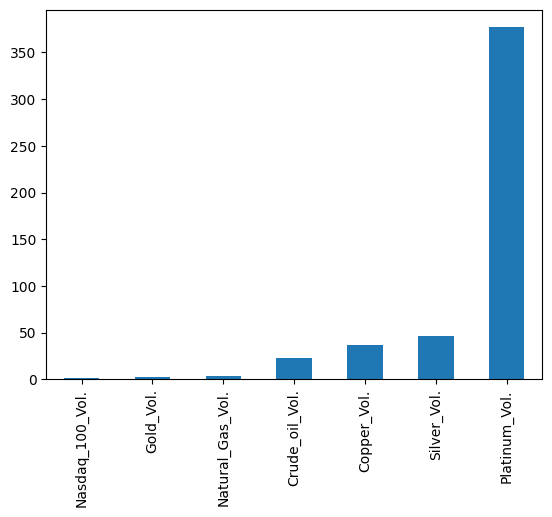

In [8]:
missing = stocks.isnull().sum() #sum up all the missing columns in a row
print(missing)
missing = missing[missing>0] #only shows missing data that are prevalent
missing.sort_values(inplace = True) #ordered sort

missing.shape, missing.plot.bar()

Evidently, there are 7 stocks / assets that have missing data with Platinum as the leading asset for most missing data. A newsletter claims that investors are losing interest in the metal due to global shortage of platinum. One of the potential reasons that may have caused the crisis includes frequent electricity cuts on South Africa, the country with the most platinum output ([Source](https://www.nasdaq.com/articles/why-does-platinum-keep-failing)). Nonetheless, Our approach to handling missing data is to perform K-Nearest Neighbours Algorithm (KNN) and fill up data that is missing.

### [K-Nearest Neighbours Algorithm (KNN)](https://www.ibm.com/topics/knn)

KNN is a supervised, non-parametric machine learning model that groups data with similar characteristics, providing predictions based on nearest euclidean distance (Note that not every classification task uses euclidean distance, alternative metrics are available) (Zhang et al, 2017). 

- supervised: Series of input and output data is first specified prior to performing actual predictions
- non-parametric: Makes limited assumptions about the underlying data

We start off by selecting columns with numerical data only.

In [9]:
numeric_columns = stocks.select_dtypes(include = [np.number, 'float']).columns.to_list()
selected_stocks = stocks[numeric_columns]

Furthermore, we apply KNN Imputer to fill in missing data:

In [10]:
knn = KNNImputer(n_neighbors = 5)
filled_stocks = knn.fit_transform(selected_stocks)
filled_df = pd.DataFrame(filled_stocks, columns = numeric_columns)

In [11]:
filled_df.head()

,Unnamed: 0,Natural_Gas_Price,Natural_Gas_Vol.,Crude_oil_Price,Crude_oil_Vol.,Copper_Price,Copper_Vol.,Bitcoin_Price,Bitcoin_Vol.,Platinum_Price,...,Berkshire_Price,Berkshire_Vol.,Netflix_Price,Netflix_Vol.,Amazon_Price,Amazon_Vol.,Meta_Price,Meta_Vol.,Gold_Price,Gold_Vol.
0,0.0,2.079,103180.0,72.28,341868.0,3.8215,57098.0,43194.7,42650.0,901.6,...,589498.0,10580.0,564.64,4030000.0,171.81,117220000.0,474.99,84710000.0,2053.7,190762.0
1,1.0,2.050,161340.0,73.82,577940.0,3.8535,34040.0,43081.4,47690.0,922.3,...,581600.0,9780.0,567.51,3150000.0,159.28,66360000.0,394.78,25140000.0,2071.1,260920.0
2,2.0,2.100,142860.0,75.85,344490.0,3.9060,89628.0,42580.5,56480.0,932.6,...,578020.0,9720.0,564.11,4830000.0,155.20,49690000.0,390.14,20010000.0,2067.4,238370.0
3,3.0,2.077,139750.0,77.82,347240.0,3.9110,78758.0,42946.2,55130.0,931.7,...,584680.0,9750.0,562.85,6120000.0,159.00,42290000.0,400.06,18610000.0,2050.9,214590.0
4,4.0,2.490,3590.0,76.78,331930.0,3.8790,76524.0,43299.8,45230.0,938.3,...,578800.0,13850.0,575.79,6880000.0,161.26,42840000.0,401.02,17790000.0,2034.9,1780.0


In [12]:
filled_df.isnull().sum()

Unnamed: 0           0
Natural_Gas_Price    0
Natural_Gas_Vol.     0
Crude_oil_Price      0
Crude_oil_Vol.       0
Copper_Price         0
Copper_Vol.          0
Bitcoin_Price        0
Bitcoin_Vol.         0
Platinum_Price       0
Platinum_Vol.        0
Ethereum_Price       0
Ethereum_Vol.        0
S&P_500_Price        0
Nasdaq_100_Price     0
Nasdaq_100_Vol.      0
Apple_Price          0
Apple_Vol.           0
Tesla_Price          0
Tesla_Vol.           0
Microsoft_Price      0
Microsoft_Vol.       0
Silver_Price         0
Silver_Vol.          0
Google_Price         0
Google_Vol.          0
Nvidia_Price         0
Nvidia_Vol.          0
Berkshire_Price      0
Berkshire_Vol.       0
Netflix_Price        0
Netflix_Vol.         0
Amazon_Price         0
Amazon_Vol.          0
Meta_Price           0
Meta_Vol.            0
Gold_Price           0
Gold_Vol.            0
dtype: int64

As we can see, the missing columns in the dataset are repaired and filled through clustering using KNN. Now we just have to merge this section of the data with the `Date`.

In [13]:
non_numerical_columns = stocks.select_dtypes(exclude=['number']).columns #select columns that aren't numerical
if len(non_numerical_columns) > 0:
    final_imputed_data = pd.concat([stocks[non_numerical_columns], filled_df], axis=1)
else:
    final_imputed_data = filled_df

final_imputed_data.head()

,Date,Unnamed: 0,Natural_Gas_Price,Natural_Gas_Vol.,Crude_oil_Price,Crude_oil_Vol.,Copper_Price,Copper_Vol.,Bitcoin_Price,Bitcoin_Vol.,...,Berkshire_Price,Berkshire_Vol.,Netflix_Price,Netflix_Vol.,Amazon_Price,Amazon_Vol.,Meta_Price,Meta_Vol.,Gold_Price,Gold_Vol.
0,02-02-2024,0.0,2.079,103180.0,72.28,341868.0,3.8215,57098.0,43194.7,42650.0,...,589498.0,10580.0,564.64,4030000.0,171.81,117220000.0,474.99,84710000.0,2053.7,190762.0
1,01-02-2024,1.0,2.050,161340.0,73.82,577940.0,3.8535,34040.0,43081.4,47690.0,...,581600.0,9780.0,567.51,3150000.0,159.28,66360000.0,394.78,25140000.0,2071.1,260920.0
2,31-01-2024,2.0,2.100,142860.0,75.85,344490.0,3.9060,89628.0,42580.5,56480.0,...,578020.0,9720.0,564.11,4830000.0,155.20,49690000.0,390.14,20010000.0,2067.4,238370.0
3,30-01-2024,3.0,2.077,139750.0,77.82,347240.0,3.9110,78758.0,42946.2,55130.0,...,584680.0,9750.0,562.85,6120000.0,159.00,42290000.0,400.06,18610000.0,2050.9,214590.0
4,29-01-2024,4.0,2.490,3590.0,76.78,331930.0,3.8790,76524.0,43299.8,45230.0,...,578800.0,13850.0,575.79,6880000.0,161.26,42840000.0,401.02,17790000.0,2034.9,1780.0


In [14]:
final_imputed_data.to_csv('final_imputed.csv', index=False)

## Performing EDA

### Preliminary Analysis

We will create a dataframe `stocks_updated` and drop the id column which will left us with the dates, prices as well as volumes for each stocks and assets.

In [15]:
stocks_updated = pd.read_csv("final_imputed.csv")
stocks_updated.drop(['Unnamed: 0'], axis = 1, inplace = True)
stocks_updated.head()

,Date,Natural_Gas_Price,Natural_Gas_Vol.,Crude_oil_Price,Crude_oil_Vol.,Copper_Price,Copper_Vol.,Bitcoin_Price,Bitcoin_Vol.,Platinum_Price,...,Berkshire_Price,Berkshire_Vol.,Netflix_Price,Netflix_Vol.,Amazon_Price,Amazon_Vol.,Meta_Price,Meta_Vol.,Gold_Price,Gold_Vol.
0,02-02-2024,2.079,103180.0,72.28,341868.0,3.8215,57098.0,43194.7,42650.0,901.6,...,589498.0,10580.0,564.64,4030000.0,171.81,117220000.0,474.99,84710000.0,2053.7,190762.0
1,01-02-2024,2.050,161340.0,73.82,577940.0,3.8535,34040.0,43081.4,47690.0,922.3,...,581600.0,9780.0,567.51,3150000.0,159.28,66360000.0,394.78,25140000.0,2071.1,260920.0
2,31-01-2024,2.100,142860.0,75.85,344490.0,3.9060,89628.0,42580.5,56480.0,932.6,...,578020.0,9720.0,564.11,4830000.0,155.20,49690000.0,390.14,20010000.0,2067.4,238370.0
3,30-01-2024,2.077,139750.0,77.82,347240.0,3.9110,78758.0,42946.2,55130.0,931.7,...,584680.0,9750.0,562.85,6120000.0,159.00,42290000.0,400.06,18610000.0,2050.9,214590.0
4,29-01-2024,2.490,3590.0,76.78,331930.0,3.8790,76524.0,43299.8,45230.0,938.3,...,578800.0,13850.0,575.79,6880000.0,161.26,42840000.0,401.02,17790000.0,2034.9,1780.0


We follow up with descriptive statistics such as mean, standard deviation, min and max values as well as the quartiles.

In [16]:
stocks_updated.describe()

,Natural_Gas_Price,Natural_Gas_Vol.,Crude_oil_Price,Crude_oil_Vol.,Copper_Price,Copper_Vol.,Bitcoin_Price,Bitcoin_Vol.,Platinum_Price,Platinum_Vol.,...,Berkshire_Price,Berkshire_Vol.,Netflix_Price,Netflix_Vol.,Amazon_Price,Amazon_Vol.,Meta_Price,Meta_Vol.,Gold_Price,Gold_Vol.
count,1013.000000,1013.000000,1013.000000,1.013000e+03,1013.000000,1013.000000,1013.000000,1.013000e+03,1013.000000,1013.000000,...,1013.000000,1013.000000,1013.000000,1.013000e+03,1013.000000,1.013000e+03,1013.000000,1.013000e+03,1013.000000,1013.000000
mean,3.726667,128966.823297,69.853475,3.557656e+05,3.726843,38815.551826,29215.594965,4.924137e+07,978.398371,10130.446199,...,424871.307009,2918.400790,422.035479,7.012043e+06,137.426209,7.452566e+07,252.151046,2.504895e+07,1839.171668,189422.768016
std,1.943030,63947.240698,21.986697,1.848100e+05,0.646524,39046.789909,15115.630151,3.251389e+08,108.577041,8752.610404,...,82654.637405,2715.637488,119.765870,6.788094e+06,27.321896,3.376809e+07,72.949246,1.635122e+07,119.066900,103907.190513
min,1.482000,1200.000000,-37.630000,1.702000e+04,2.100500,10.000000,4826.000000,2.600000e+02,595.200000,0.000000,...,240000.000000,120.000000,166.370000,1.140000e+06,81.820000,2.162000e+07,88.910000,5.470000e+06,1477.900000,0.000000
25%,2.447000,88680.000000,54.760000,2.744100e+05,3.408000,420.000000,17180.100000,7.142000e+04,909.600000,2260.000000,...,349540.000000,760.000000,338.630000,3.780000e+06,114.770000,5.192000e+07,195.210000,1.612000e+07,1763.800000,143050.000000
50%,2.880000,125390.000000,72.910000,3.442200e+05,3.800500,39260.000000,27634.900000,1.288800e+05,969.700000,8380.000000,...,432000.000000,2040.000000,431.600000,5.380000e+06,142.300000,6.515000e+07,262.010000,2.107000e+07,1835.800000,181200.000000
75%,4.805000,164650.000000,82.810000,4.221500e+05,4.251500,72116.000000,40914.800000,3.860000e+05,1036.900000,16950.000000,...,481955.000000,4090.000000,509.640000,7.890000e+06,161.060000,8.683000e+07,313.190000,2.903000e+07,1936.600000,231490.000000
max,9.647000,381970.000000,123.700000,1.770000e+06,4.937500,176040.000000,67527.900000,4.470000e+09,1297.100000,42830.000000,...,589498.000000,13850.000000,691.690000,1.333900e+08,186.570000,3.113500e+08,474.990000,2.304100e+08,2089.700000,813410.000000


如果我们只根据这些信息来分析股票市场，我们不会有太多的细节。我们决定绘制单独的直方图和线形图，以观察每种股票和资产的价格如何随时间波动。我们将使用seaborn来获得更美观的可视化效果。

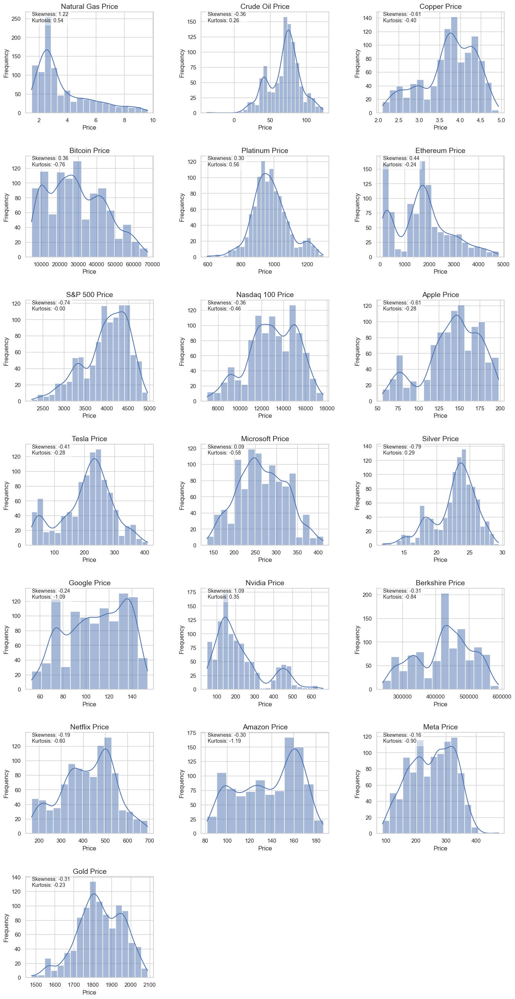

In [17]:
price_columns_new = [col for col in stocks_updated.columns if 'Price' in col] #all the prices of stocks

import seaborn as sns

sns.set_theme(style="whitegrid")

n = len(price_columns_new)
ncols = 3
nrows = n // ncols + (n % ncols > 0)

fig, axes = plt.subplots(nrows, ncols, figsize=(15, nrows*4))
fig.tight_layout(pad=5.0)

skewness_values = []
kurtosis_values = []

for i, col in enumerate(price_columns_new):
    skew = skew_value = stocks_updated[col].skew()
    kurtosis = kurtosis_value = stocks_updated[col].kurtosis()
    skewness_values.append(skew)
    kurtosis_values.append(kurtosis)
    ax = axes.flat[i]
    ax.text(0.05, 0.9, f'Skewness: {skew:.2f}\nKurtosis: {kurtosis:.2f}', transform = ax.transAxes, fontsize = 10,
            bbox = dict(facecolor='white', alpha=0.5)) #text label for skewness and kurtosis
    sns.histplot(stocks_updated[col], kde=True, ax=ax) #seaborn template for histogram
    ax.set_title(col.replace('_', ' ').title(), fontsize=14)
    ax.set_xlabel('Price', fontsize=12)
    ax.set_ylabel('Frequency', fontsize=12)


for j in range(i+1, nrows*ncols):
    axes.flat[j].set_visible(False)

plt.show()
fig.savefig("stock prices")

我们试图观察每只股票的价格分布。一般来说，有些股票不一定遵循正态或对数正态分布曲线。以天然气为例，曲线向右偏斜较大，为负偏度。

然而，这些信息缺乏解释股票在时间方面如何表现的细节。因此，我们需要其他的方法来可视化，一个经典的例子是时间序列图。我们将包括布林带和移动平均线来确定它的波动性，换句话说，股票的稳定性。

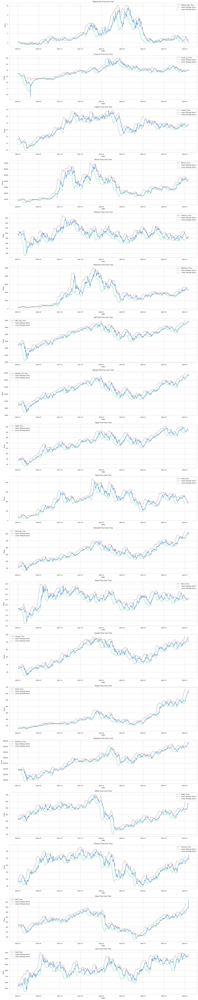

In [18]:
import matplotlib.pyplot as plt
import seaborn as sns

data = stocks_updated["Date"]

# Define a function to handle different date formats
def parse_date(date_str):
  try:
    # Try parsing with format "%m/%d/%Y" (DD-MM-YYYY)
    return pd.to_datetime(date_str, format="%d/%m/%Y")
  except ValueError:
    # If parsing fails, try format "%d-%m-%Y" (DD-MM-YYYY)
    return pd.to_datetime(date_str, format="%d-%m-%Y")

# Parse the dates using the function
result = pd.to_datetime([parse_date(date) for date in data])

stocks_updated["Date"] = result
# Plotting price trends over time
plt.figure(figsize=(20, 100))

for i, col in enumerate(price_columns_new):
    price_series = pd.Series(stocks_updated[col]) #convert column to pandas series

    rolling_mean = price_series.rolling(window=20).mean() 
    rolling_std = price_series.rolling(window=20).std()

    upper_band = rolling_mean + (2 * rolling_std)
    lower_band = rolling_mean - (2 * rolling_std)

    plt.subplot(len(price_columns_new), 1, i+1)
    plt.plot(stocks_updated['Date'], stocks_updated[col], label=col)
    plt.plot(stocks_updated['Date'], upper_band, 'r--', label='Upper Bollinger Band')
    plt.plot(stocks_updated['Date'], lower_band, 'g--', label='Lower Bollinger Band')
    plt.fill_between(stocks_updated['Date'], lower_band, upper_band, color='azure')
    plt.title(f'{col.replace("_", " ")} Over Time')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()

plt.tight_layout()
plt.show()

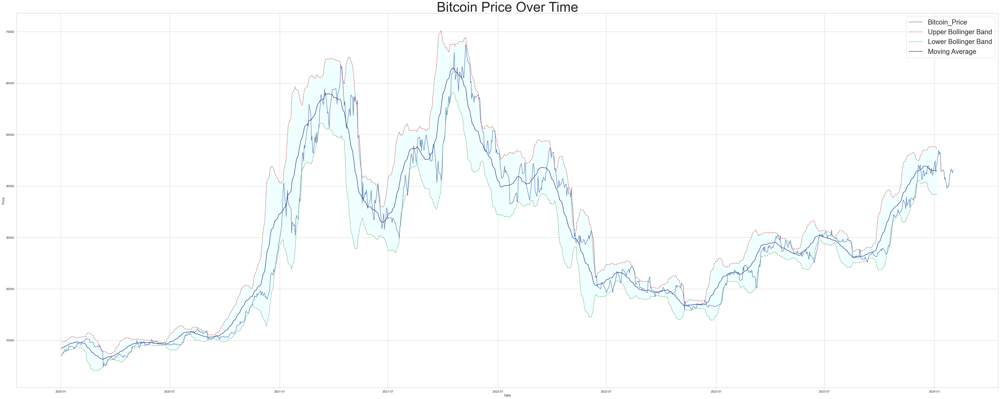

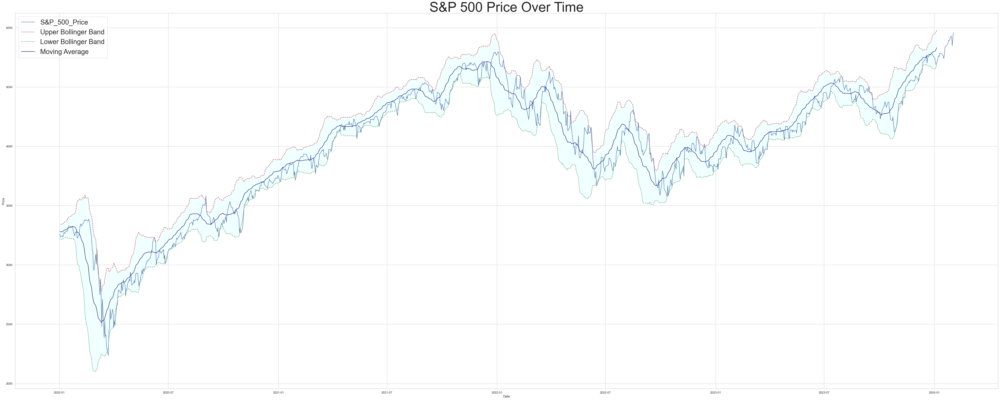

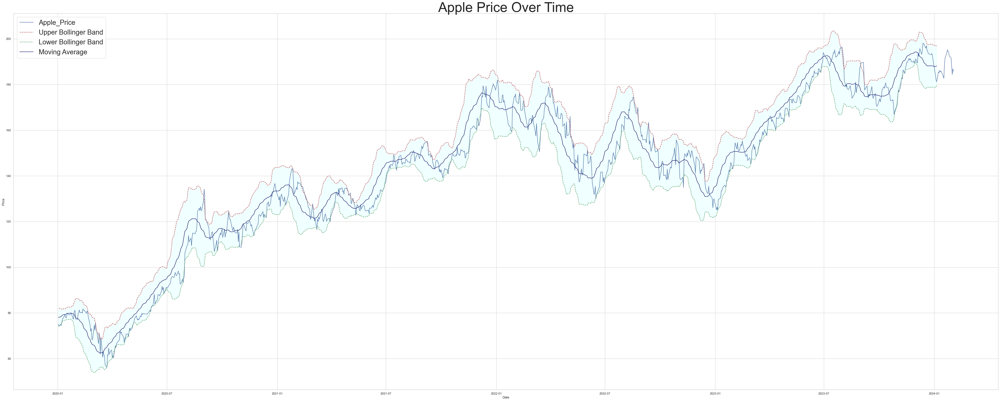

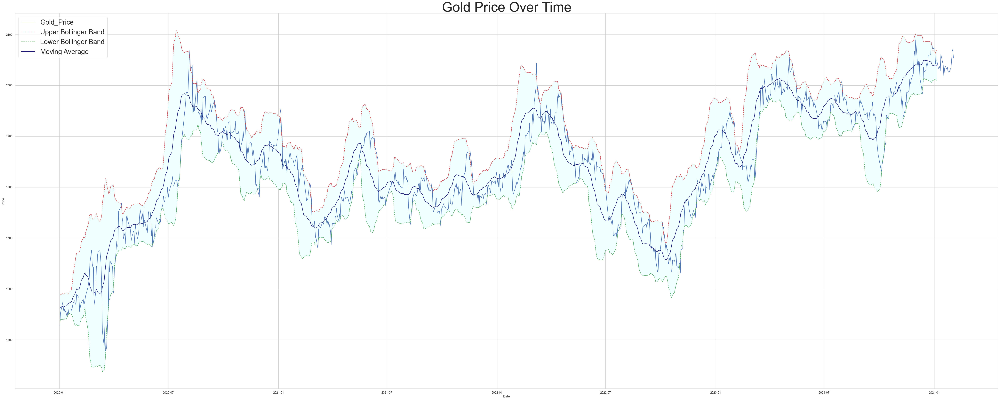

In [19]:
specific_stocks = ['S&P_500_Price', 'Apple_Price', 'Gold_Price', 'Bitcoin_Price']
price_columns_specific = [col for col in stocks_updated.columns if any(stock in col for stock in specific_stocks)]

for col in price_columns_specific:
    price_series = pd.Series(stocks_updated[col]) #convert column to pandas series

    rolling_mean = price_series.rolling(window = 20).mean() 
    rolling_std = price_series.rolling(window = 20).std()

    upper_band = rolling_mean + (2 * rolling_std)
    lower_band = rolling_mean - (2 * rolling_std)
    
    plt.figure(figsize= (65, 25))
    plt.plot(stocks_updated['Date'], stocks_updated[col], label=col)
    plt.plot(stocks_updated['Date'], upper_band, 'r--', label='Upper Bollinger Band')
    plt.plot(stocks_updated['Date'], lower_band, 'g--', label='Lower Bollinger Band')
    plt.plot(stocks_updated['Date'], rolling_mean, label='Moving Average', color='midnightblue')
    plt.fill_between(stocks_updated['Date'], lower_band, upper_band, color='azure')
    plt.title(f'{col.replace("_", " ")} Over Time', fontsize = 50)
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend(fontsize=25)

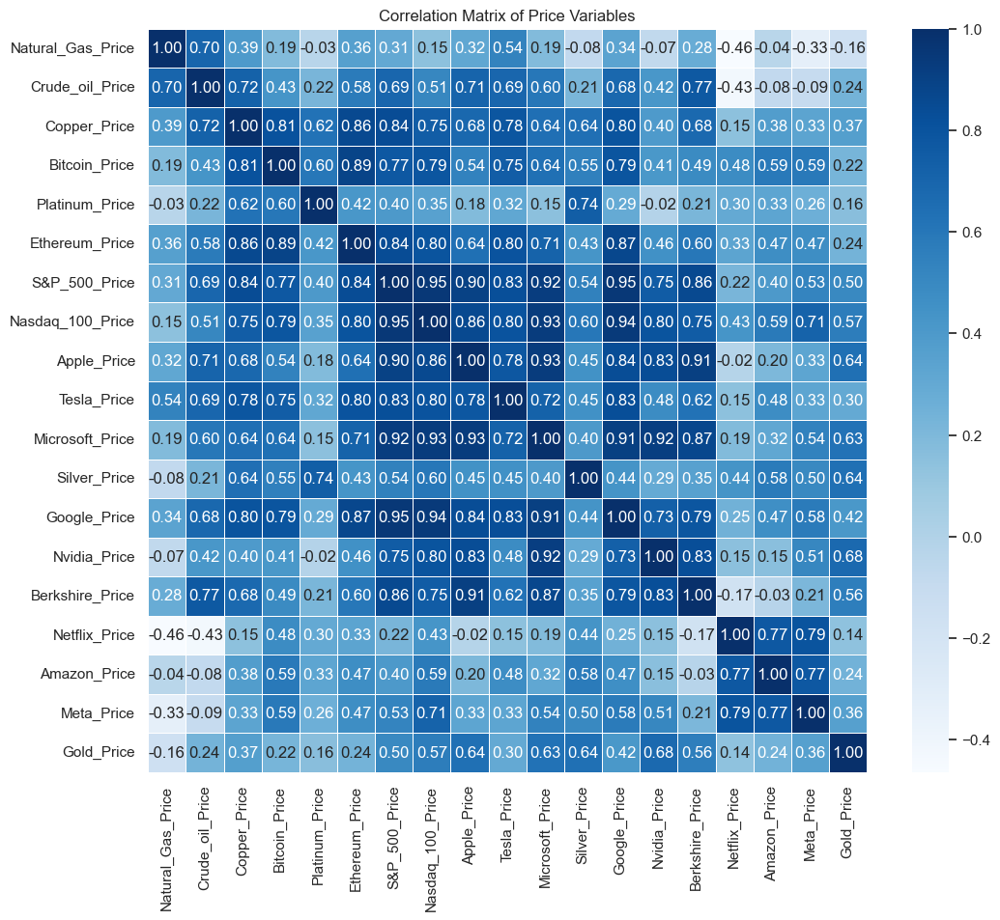

In [20]:
# Calculate the correlation matrix for price variables
correlation_matrix = stocks_updated[price_columns_new].corr()

# Plotting the heatmap of the correlation matrix
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='Blues', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix of Price Variables')
plt.show()

## 股票和资产之间的相关性

我们不应该把所有的鸡蛋放在一个篮子里，相反，我们应该把鸡蛋分散在多个篮子里，以尽量减少损失。同样，投资于多种业务和资产比冒险将所有积蓄投入一项业务/资产更安全。然而，有人可能会好奇，我应该投资哪种股票和资产组合才能产生最大的收益?

答案是看相关矩阵。相关矩阵，也称为相关热图，描绘了每个变量的密切相关程度。
## 以微软为例。我们可以看到，它与苹果、纳斯达克、标准普尔、英伟达和谷歌高度相关

如果你的首选是微软，我们可以推荐你投资这些公司。用这种方法分析可以让我们知道不同公司的股票价格可能会出现什么样的趋势。

## Granger Casuality and Kaiser-Meyer-Olkin (KMO) Tests

我们研究了更多的影响衡量股票的可预测性。统计学中有一个流行的说法，相关性并不意味着因果关系。这意味着，当两个变量的行为相似时，并不意味着一个变量导致了另一个变量。我们必须分开看原因。这就是为什么我们采用格兰杰因果检验来检验一个时间序列是否会影响另一个时间序列。

我们的第二个调查是检查我们数据集的抽样充分性，这是我们在抽样数据过程中的总体良好性。我们采用Kaiser-Meyer-Olkin (KMO)检验来度量方差的比例。该检验还用于确定我们的样本是否适合进行因子分析。

### Statistical Prerequisite: ADF and KPSS Cross Testing for Stationary Time Series 

格兰杰因果检验需要一个统计前提，其中数据集是平稳的。为了验证这一前提，我们进行了增强的Dickey Fuller (ADF)和Kwiatkowski-Phillips-Schmidt-Shin (KPSS)测试。我们为微软和苹果的价格时间序列建立零假设$H_0$和备择假设$H_1$:

| Hypothesis Testing | ADF | KPSS |
| - | - | - |
| $H_0$ | Time series does not have a unit root (not stationary) | Time series have a unit root (stationary) |
| $H_1$ | Time series have a unit root (stationary) | Time series does not have a unit root (not stationary) |

In [21]:
from statsmodels.tsa.stattools import adfuller

def adf_test(df):
    result = adfuller(df.values)
    print('ADF Statistics: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Critical values:')
    for key, value in result[4].items():
        print('\t%s: %.3f' % (key, value))

print("ADF Test for Microsoft time series")
adf_test(stocks_updated['Microsoft_Price'])
print("ADF Test for Apple time series")
adf_test(stocks_updated['Apple_Price'])


ADF Test for Microsoft time series
ADF Statistics: -1.634632
p-value: 0.465067
Critical values:
	1%: -3.437
	5%: -2.864
	10%: -2.568
ADF Test for Apple time series
ADF Statistics: -0.808153
p-value: 0.816716
Critical values:
	1%: -3.437
	5%: -2.864
	10%: -2.568


ADF test states that the P-value of both time series are significantly higher than $\alpha$ = 0.05. Results imply that we don't have enough evidence to reject $H_0$, so the time series are not stationary.

In [22]:
from statsmodels.tsa.stattools import kpss

def kpss_test(df):    
    statistic, p_value, n_lags, critical_values = kpss(df.values)
    
    print(f'KPSS Statistic: {statistic}')
    print(f'p-value: {p_value}')
    print(f'num lags: {n_lags}')
    print('Critial Values:')
    for key, value in critical_values.items():
        print(f'   {key} : {value}')

print("KPSS Test for Microsoft time series")
kpss_test(stocks_updated['Microsoft_Price'])
print("KPSS Test for Apple time series")
kpss_test(stocks_updated['Apple_Price'])

KPSS Test for Microsoft time series
KPSS Statistic: 3.277222785396732
p-value: 0.01
num lags: 19
Critial Values:
   10% : 0.347
   5% : 0.463
   2.5% : 0.574
   1% : 0.739
KPSS Test for Apple time series
KPSS Statistic: 3.936620945534801
p-value: 0.01
num lags: 19
Critial Values:
   10% : 0.347
   5% : 0.463
   2.5% : 0.574
   1% : 0.739


C:\Windows\Temp\ipykernel_60104\3120907347.py:4: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  statistic, p_value, n_lags, critical_values = kpss(df.values)
C:\Windows\Temp\ipykernel_60104\3120907347.py:4: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  statistic, p_value, n_lags, critical_values = kpss(df.values)


KPSS Test produces similar results where we have enough evidence to reject $H_0$, and the alternative hypothesis suggests that the time series is not stationary. Cross testing of ADF and KPSS show consistent findings where we have to apply differencing to the dataset.

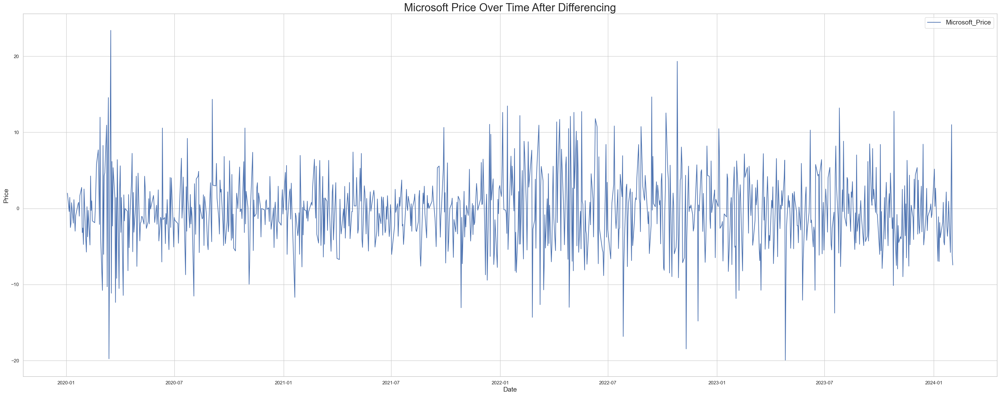

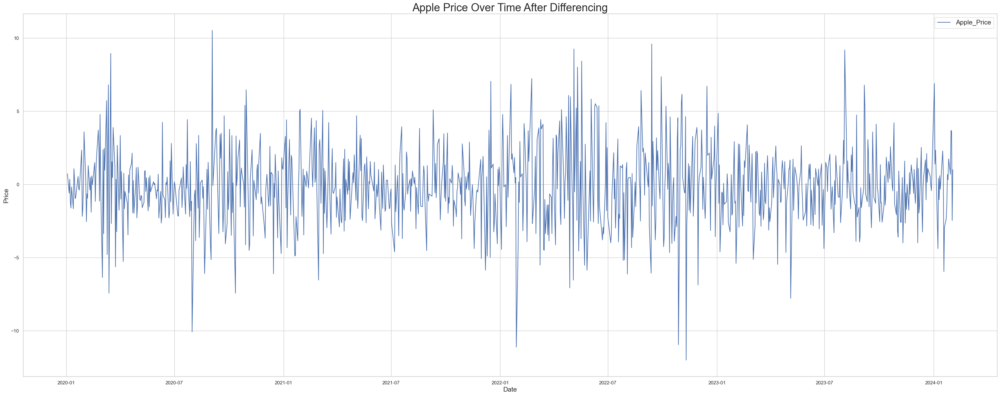

ADF Statistics: -10.248201
p-value: 0.000000
Critical values:
	1%: -3.437
	5%: -2.864
	10%: -2.568
ADF Statistics: -32.624320
p-value: 0.000000
Critical values:
	1%: -3.437
	5%: -2.864
	10%: -2.568


In [23]:
Microsoft_transformed = stocks_updated['Microsoft_Price'].diff().dropna()
Apple_transformed = stocks_updated['Apple_Price'].diff().dropna()

date_series = stocks_updated['Date'][:-1]  #Adjusting date series since differencing results in one less element from the original series

plt.figure(figsize=(40, 15))
plt.plot(date_series, Microsoft_transformed, label='Microsoft_Price')
plt.legend(fontsize=15)
plt.title('Microsoft Price Over Time After Differencing', fontsize=25)
plt.xlabel('Date', fontsize=15)
plt.ylabel('Price', fontsize=15)
plt.show()

plt.figure(figsize=(40, 15))
plt.plot(date_series, Apple_transformed, label='Apple_Price')
plt.legend(fontsize=15)
plt.title('Apple Price Over Time After Differencing', fontsize=25)
plt.xlabel('Date', fontsize=15)
plt.ylabel('Price', fontsize=15)
plt.show()

adf_test(Microsoft_transformed)
adf_test(Apple_transformed)

经一阶差分检验，调整后的时间序列确实有单位根，因此是平稳的。现在我们可以用格兰杰因果检验来检验可预测性。

In [24]:
from statsmodels.tsa.stattools import grangercausalitytests

time_series_data = pd.concat([Microsoft_transformed, Apple_transformed], axis=1)
time_series_data.columns = ['Microsoft_Price', 'Apple_Price']

max_lags = 5
granger_test_results = grangercausalitytests(time_series_data, maxlag=max_lags, verbose=True)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.4970  , p=0.0342  , df_denom=1008, df_num=1
ssr based chi2 test:   chi2=4.5104  , p=0.0337  , df=1
likelihood ratio test: chi2=4.5004  , p=0.0339  , df=1
parameter F test:         F=4.4970  , p=0.0342  , df_denom=1008, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.8758  , p=0.0568  , df_denom=1005, df_num=2
ssr based chi2 test:   chi2=5.7803  , p=0.0556  , df=2
likelihood ratio test: chi2=5.7638  , p=0.0560  , df=2
parameter F test:         F=2.8758  , p=0.0568  , df_denom=1005, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=3.1878  , p=0.0231  , df_denom=1002, df_num=3
ssr based chi2 test:   chi2=9.6303  , p=0.0220  , df=3
likelihood ratio test: chi2=9.5847  , p=0.0224  , df=3
parameter F test:         F=3.1878  , p=0.0231  , df_denom=1002, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.5389  , p=0.

c:\Users\白瑞\AppData\Local\Programs\Python\Python311\Lib\site-packages\statsmodels\tsa\stattools.py:1545: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(


Based on the results, the test suggests that previous 1st, 3rd, 4th lagged terms of stock prices for Apple Granger causes Microsoft, which exhibits significant predictability for Microsoft prices. This test can also be applied to other stocks.

In [25]:
from factor_analyzer import FactorAnalyzer
from factor_analyzer.factor_analyzer import calculate_kmo, calculate_bartlett_sphericity

kmo_all, kmo_model = calculate_kmo(stocks_updated[price_columns_new])
bartlett_sphericity_test_stat, p_value = calculate_bartlett_sphericity(stocks_updated[price_columns_new])

kmo_model, bartlett_sphericity_test_stat, p_value

(0.8080231492995462, 42619.69669864003, 0.0)

从结果来看，kmo值在0.8以上，表明我们的采样方法是可取的。我们还进行了bartlett球度检验，有足够的证据支持我们的相关矩阵不是单位矩阵，适合于结构检测。

### 根据苹果、纳斯达克、标准普尔、英伟达和谷歌的股票情况预测微软的股票价格

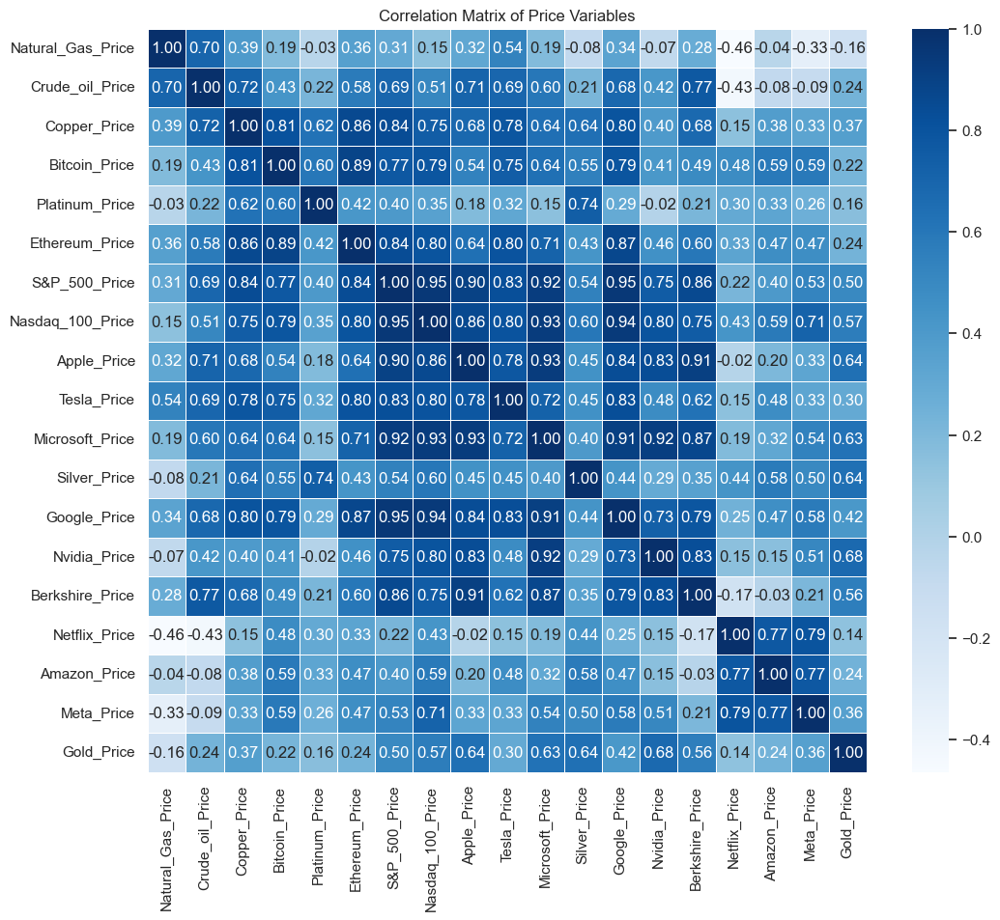

In [26]:
# Calculate the correlation matrix for price variables
correlation_matrix = stocks_updated[price_columns_new].corr()

# Plotting the heatmap of the correlation matrix
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='Blues', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix of Price Variables')
plt.show()

In [27]:
pridictors = final_imputed_data[['Date','Microsoft_Price','Apple_Price',  'Nasdaq_100_Price', 'Nvidia_Price','Google_Price','Berkshire_Price','S&P_500_Price']]
pridictors.head()

,Date,Microsoft_Price,Apple_Price,Nasdaq_100_Price,Nvidia_Price,Google_Price,Berkshire_Price,S&P_500_Price
0,02-02-2024,411.22,185.85,17642.73,661.60,142.38,589498.0,4958.61
1,01-02-2024,403.78,186.86,17344.71,630.27,141.16,581600.0,4906.19
2,31-01-2024,397.58,184.40,17137.24,615.27,140.10,578020.0,4848.87
3,30-01-2024,408.59,188.04,17476.71,627.74,151.46,584680.0,4924.97
4,29-01-2024,409.72,191.73,17596.27,624.65,153.51,578800.0,4927.93


In [28]:
#将日期设置为索引
pridictors.set_index('Date', inplace=True)
#设置日期索引格式为%Y-%m-%d
pridictors.index = pd.to_datetime(pridictors.index, format='%d-%m-%Y')

pridictors.head()

,Microsoft_Price,Apple_Price,Nasdaq_100_Price,Nvidia_Price,Google_Price,Berkshire_Price,S&P_500_Price
Date,,,,,,,
2024-02-02,411.22,185.85,17642.73,661.60,142.38,589498.0,4958.61
2024-02-01,403.78,186.86,17344.71,630.27,141.16,581600.0,4906.19
2024-01-31,397.58,184.40,17137.24,615.27,140.10,578020.0,4848.87
2024-01-30,408.59,188.04,17476.71,627.74,151.46,584680.0,4924.97
2024-01-29,409.72,191.73,17596.27,624.65,153.51,578800.0,4927.93


In [29]:
#逆序排列
pridictors = pridictors.iloc[::-1]
pridictors.head()

,Microsoft_Price,Apple_Price,Nasdaq_100_Price,Nvidia_Price,Google_Price,Berkshire_Price,S&P_500_Price
Date,,,,,,,
2020-01-02,160.62,75.09,8872.22,59.98,68.43,342261.0,3257.85
2020-01-03,158.62,74.36,8793.90,59.02,68.08,339155.0,3234.85
2020-01-06,159.03,74.95,8848.51,59.27,69.89,340210.0,3246.28
2020-01-07,157.58,74.60,8846.45,59.98,69.76,338901.0,3237.18
2020-01-08,160.09,75.80,8912.37,60.09,70.25,339188.0,3253.05


MSE: 1763.34
R2: -1.16


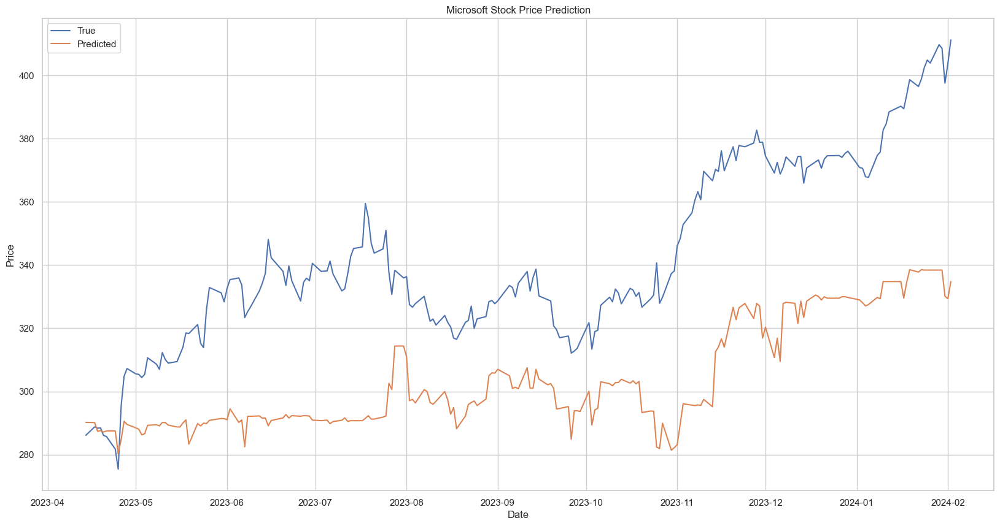

In [30]:
#使用xgboost预测，将其他股票价格作为预测因子预测微软股票价格
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.preprocessing import MinMaxScaler

#将数据集分为训练集和测试集
train, test = train_test_split(pridictors, test_size=0.2, shuffle=False)

#将数据集分为特征和标签
X_train = train.drop('Microsoft_Price', axis=1)
y_train = train['Microsoft_Price']
X_test = test.drop('Microsoft_Price', axis=1)
y_test = test['Microsoft_Price']

#xgboost模型
model = XGBRegressor()
model.fit(X_train, y_train)

#预测
y_pred = model.predict(X_test)

#计算均方误差
mse = mean_squared_error(y_test, y_pred)
print('MSE: %.2f' % mse)

#计算R2
r2 = r2_score(y_test, y_pred)
print('R2: %.2f' % r2)

#绘制预测结果
plt.figure(figsize=(20, 10))
plt.plot(y_test.index, y_test.values, label='True')
plt.plot(y_test.index, y_pred, label='Predicted')
plt.title('Microsoft Stock Price Prediction')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

In [31]:
#保存xgboost模型的预测结果
xgboost_result = test.copy()
xgboost_result['Predicted_Microsoft_Price'] = y_pred
xgboost_result.to_csv('xgboost_result.csv')

xgboost的结果不是很好,尝试一下其他模型的拟合

c:\Users\白瑞\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                     │ (None, 50)             │        11,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1)              │            51 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,451 (44.73 KB)

 Trainable params: 11,451 (44.73 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0585 - root_mean_squared_error: 0.2299 - val_loss: 0.0072 - val_root_mean_squared_error: 0.0794
Epoch 2/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0023 - root_mean_squared_error: 0.0481 - val_loss: 0.0037 - val_root_mean_squared_error: 0.0611
Epoch 3/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 9.5760e-04 - root_mean_squared_error: 0.0310 - val_loss: 0.0024 - val_root_mean_squared_error: 0.0506
Epoch 4/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 8.7601e-04 - root_mean_squared_error: 0.0296 - val_loss: 0.0024 - val_root_mean_squared_error: 0.0513
Epoch 5/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 7.9991e-04 - root_mean_squared_error: 0.0283 - val_loss: 0.0022 - val_root_mean_squared_error: 0.0493
Epoch 6/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 8.4314e-04 - root_mean_squared_error: 0.0290 - val_loss: 0.0024 - val_root_mean_squared_error: 0.0509
Epoch 7/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s

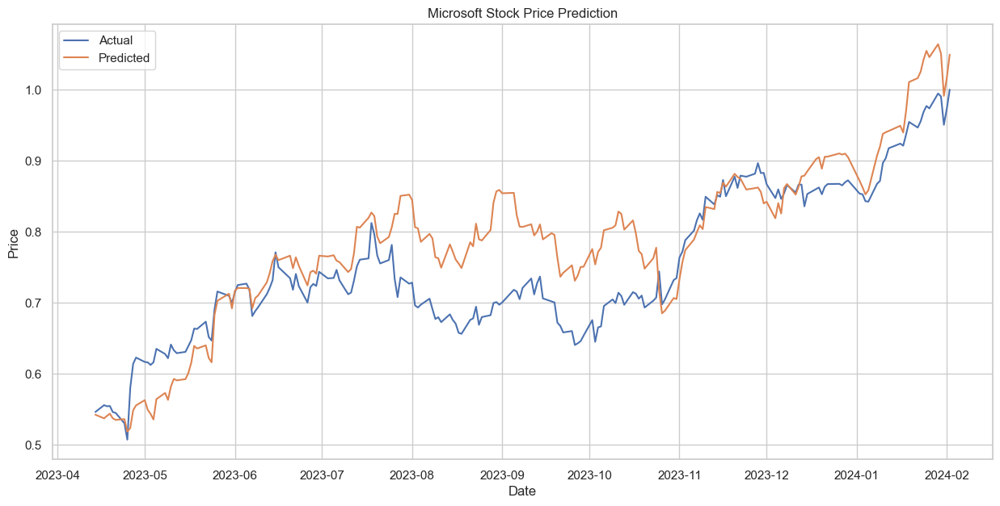

In [32]:
#使用lstm预测，将其他股票价格作为预测因子预测微软股票价格
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import Dense, LSTM
from keras.optimizers import Adam
from keras.losses import MeanSquaredError
from keras.metrics import RootMeanSquaredError
from keras.callbacks import EarlyStopping

#将数据集标准化
scaler = MinMaxScaler()
standard_pridictors = pd.DataFrame(scaler.fit_transform(pridictors), columns=pridictors.columns, index=pridictors.index)

#将数据集分为训练集和测试集
train, test = train_test_split(standard_pridictors, test_size=0.2, shuffle=False)

#将数据集分为特征和标签
X_train = train.drop('Microsoft_Price', axis=1)
y_train = train['Microsoft_Price']
X_test = test.drop('Microsoft_Price', axis=1)
y_test = test['Microsoft_Price']

#将数据集转换为lstm输入格式
X_train = X_train.values.reshape(X_train.shape[0], 1, X_train.shape[1])
X_test = X_test.values.reshape(X_test.shape[0], 1, X_test.shape[1])

#创建lstm模型
model = Sequential()
model.add(LSTM(50, activation='relu', input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(Dense(1))
model.compile(optimizer=Adam(learning_rate=0.01), loss=MeanSquaredError(), metrics=[RootMeanSquaredError()])
model.summary()

#拟合模型
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test), callbacks=[EarlyStopping(patience=10)], verbose=1)

#预测
y_pred = model.predict(X_test)

#计算评估指标
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')
r2 = r2_score(y_test, y_pred)
print(f'R2 Score: {r2}')

#绘制预测结果
plt.figure(figsize=(15, 7))

plt.plot(test.index, y_test, label='Actual')
plt.plot(test.index, y_pred, label='Predicted')

plt.title('Microsoft Stock Price Prediction')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()


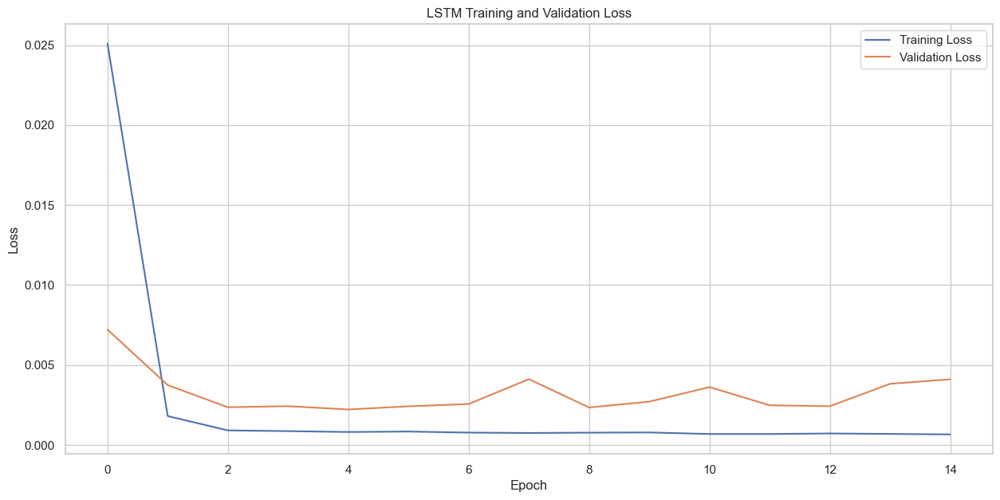

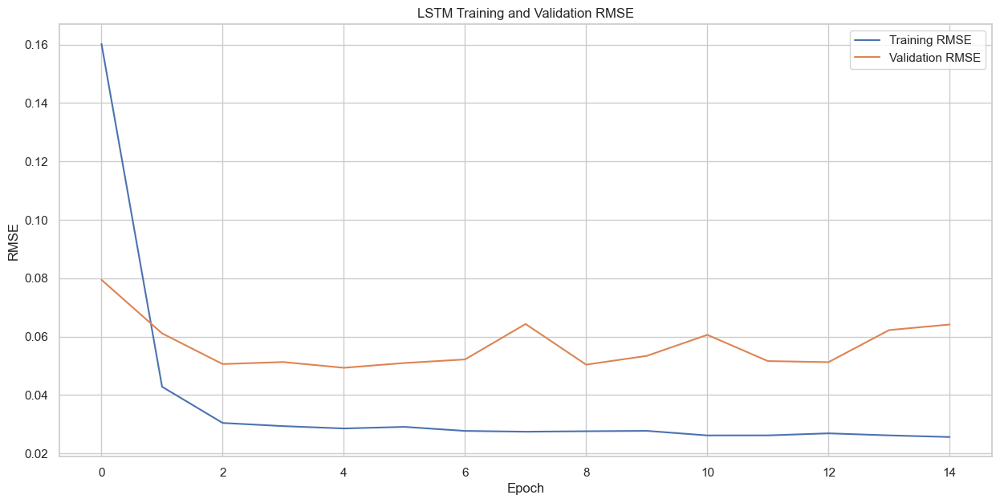

In [33]:
#绘制lstm的训练和验证损失
plt.figure(figsize=(15, 7))

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')

plt.title('LSTM Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

#绘制lstm的训练和验证rmse
plt.figure(figsize=(15, 7))

plt.plot(history.history['root_mean_squared_error'], label='Training RMSE')
plt.plot(history.history['val_root_mean_squared_error'], label='Validation RMSE')

plt.title('LSTM Training and Validation RMSE')
plt.xlabel('Epoch')
plt.ylabel('RMSE')
plt.legend()
plt.show()

In [34]:
#将lstm的预测结果写入csv文件
lstm_result = test.copy()
lstm_result['Predicted_Microsoft_Price'] = y_pred
lstm_result.to_csv('xgboost_result.csv')

尝试使用knn

Mean Squared Error: 0.012222809561889526
R2 Score: 0.7242796269797708


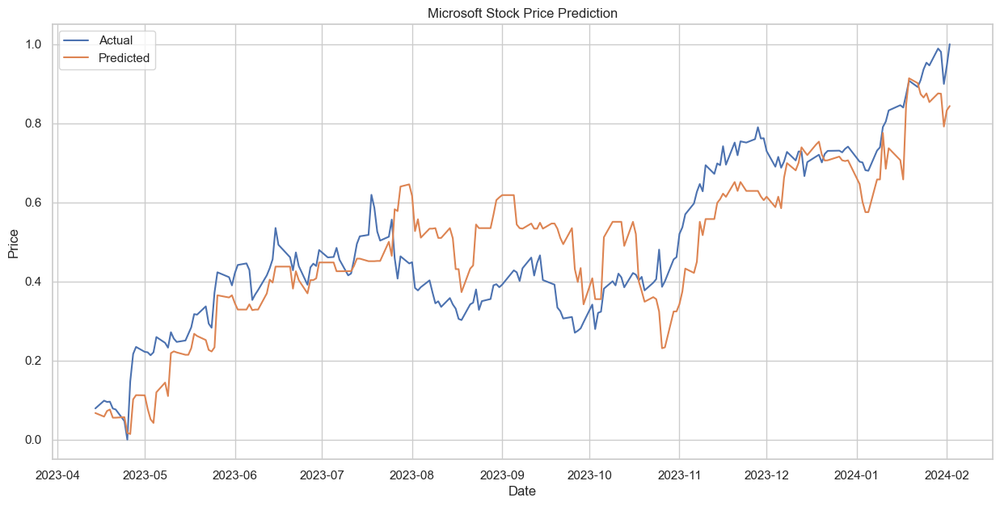

In [35]:
#使用knn预测，将其他股票价格作为预测因子预测微软股票价格
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.preprocessing import MinMaxScaler

#将数据集分为训练集和测试集，并将数据集标准化
train, test = train_test_split(pridictors, test_size=0.2, shuffle=False)
scaler = MinMaxScaler()
X_train = scaler.fit_transform(train.drop('Microsoft_Price', axis=1))
y_train=scaler.fit_transform(train['Microsoft_Price'].values.reshape(-1,1))
X_test = scaler.fit_transform(test.drop('Microsoft_Price', axis=1))
y_test=scaler.fit_transform(test['Microsoft_Price'].values.reshape(-1,1))

#创建knn回归模型
model = KNeighborsRegressor(n_neighbors=5)

#拟合模型
model.fit(X_train, y_train)

#预测
y_pred = model.predict(X_test)

#计算评估指标
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')
r2 = r2_score(y_test, y_pred)
print(f'R2 Score: {r2}')

#绘制预测结果
plt.figure(figsize=(15, 7))

plt.plot(test.index, y_test, label='Actual')
plt.plot(test.index, y_pred, label='Predicted')

plt.title('Microsoft Stock Price Prediction')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()


In [36]:
#保存knn的预测结果
knn_pred = pd.DataFrame({'Date': test.index, 'Actual': y_test.flatten(), 'knn_Predicted': y_pred.flatten()})
knn_pred.to_csv('knn_pred.csv', index=False)

### 尝试使用cnn预测

c:\Users\白瑞\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d (Conv1D)                 │ (None, 5, 64)          │           192 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d (MaxPooling1D)    │ (None, 2, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 50)             │         6,450 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │            51 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,693 (26.14 KB)

 Trainable params: 6,693 (26.14 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0493 - root_mean_squared_error: 0.2053 - val_loss: 0.0291 - val_root_mean_squared_error: 0.1598
Epoch 2/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0012 - root_mean_squared_error: 0.0345 - val_loss: 0.0175 - val_root_mean_squared_error: 0.1228
Epoch 3/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 8.4798e-04 - root_mean_squared_error: 0.0291 - val_loss: 0.0098 - val_root_mean_squared_error: 0.0912
Epoch 4/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.9374e-04 - root_mean_squared_error: 0.0263 - val_loss: 0.0089 - val_root_mean_squared_error: 0.0860
Epoch 5/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5.9986e-04 - root_mean_squared_error: 0.0245 - val_loss: 0.0155 - val_root_mean_squared_error: 0.1152
Epoch 6/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 9.5260e-04 - root_mean_squared_error: 0.0308 - val_loss: 0.0115 - val_root_mean_squared_error: 0.0974
Epoch 7/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 

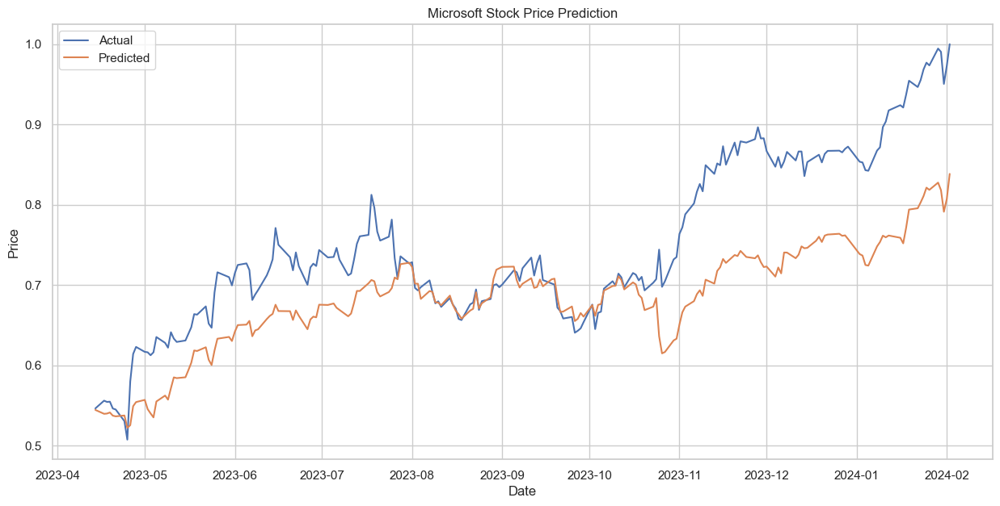

In [37]:
#使用cnn预测，将其他股票价格作为预测因子预测微软股票价格
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import Conv1D, MaxPooling1D, Flatten, Dense
from keras.optimizers import Adam
from keras.losses import MeanSquaredError
from keras.metrics import RootMeanSquaredError
from keras.callbacks import EarlyStopping

#将数据集标准化
scaler = MinMaxScaler()
standard_pridictors = pd.DataFrame(scaler.fit_transform(pridictors), columns=pridictors.columns, index=pridictors.index)

#将数据集分为训练集和测试集
train, test = train_test_split(standard_pridictors, test_size=0.2, shuffle=False)

#将数据集分为特征和标签
X_train = train.drop('Microsoft_Price', axis=1)
y_train = train['Microsoft_Price']
X_test = test.drop('Microsoft_Price', axis=1)
y_test = test['Microsoft_Price']

#将数据集转换为cnn输入格式
X_train = X_train.values.reshape(X_train.shape[0], X_train.shape[1], 1)
X_test = X_test.values.reshape(X_test.shape[0], X_test.shape[1], 1)

#创建cnn模型
model = Sequential()
model.add(Conv1D(filters=64, kernel_size=2, activation='relu', input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(MaxPooling1D(pool_size=2))
model.add(Flatten())
model.add(Dense(50, activation='relu'))
model.add(Dense(1))
model.compile(optimizer=Adam(learning_rate=0.01), loss=MeanSquaredError(), metrics=[RootMeanSquaredError()])
model.summary()

#拟合模型
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test), callbacks=[EarlyStopping(patience=10)], verbose=1)

#预测
y_pred = model.predict(X_test)

#计算评估指标
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')
r2 = r2_score(y_test, y_pred)
print(f'R2 Score: {r2}')

#绘制预测结果
plt.figure(figsize=(15, 7))

plt.plot(test.index, y_test, label='Actual')
plt.plot(test.index, y_pred, label='Predicted')

plt.title('Microsoft Stock Price Prediction')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

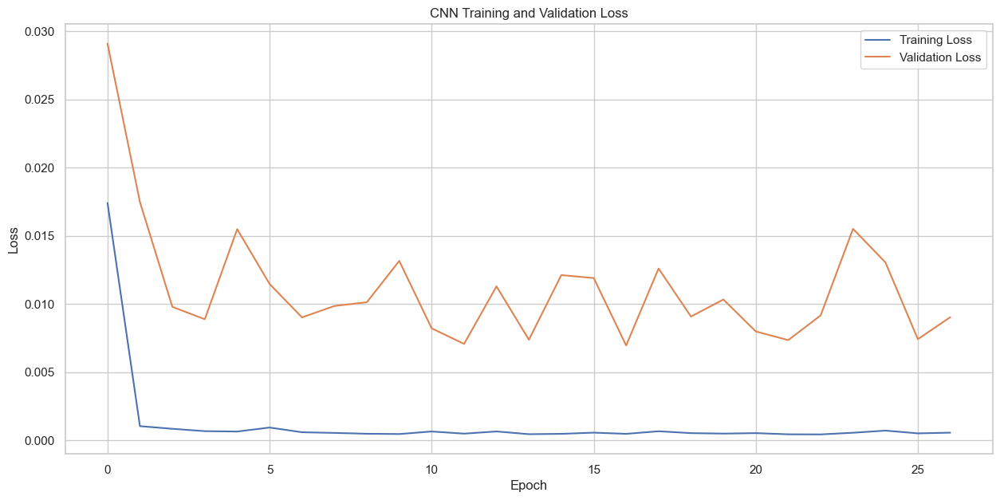

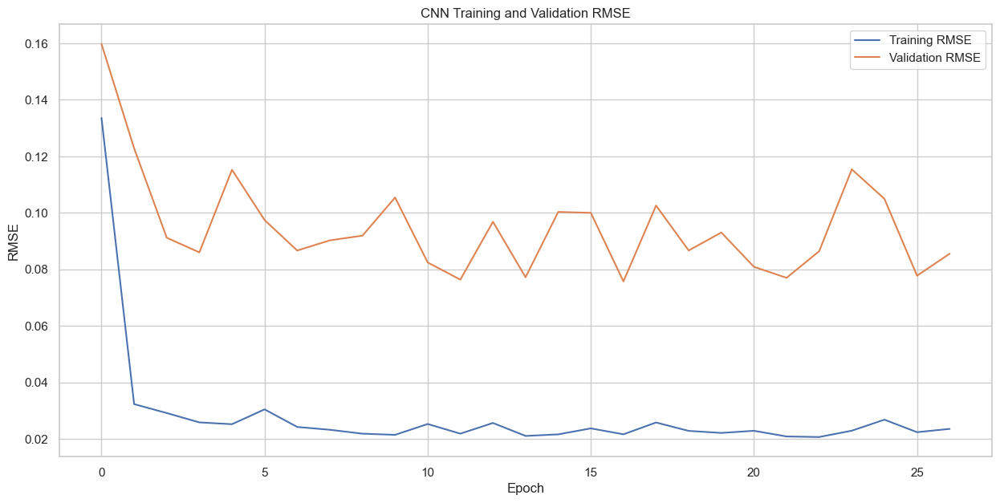

In [38]:
#绘制cnn的训练和验证损失
plt.figure(figsize=(15, 7))

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')

plt.title('CNN Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

#绘制cnn的训练和验证rmse
plt.figure(figsize=(15, 7))

plt.plot(history.history['root_mean_squared_error'], label='Training RMSE')
plt.plot(history.history['val_root_mean_squared_error'], label='Validation RMSE')

plt.title('CNN Training and Validation RMSE')
plt.xlabel('Epoch')
plt.ylabel('RMSE')
plt.legend()
plt.show()

In [39]:
#将cnn的预测结果写入csv文件
cnn_pred = pd.DataFrame({'Date': test.index, 'Actual': y_test, 'cnn_Predicted': y_pred.flatten()})
cnn_pred.to_csv('cnn_pred.csv', index=False)


### 尝试使用rnn模型预测

c:\Users\白瑞\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ simple_rnn (SimpleRNN)          │ (None, 50)             │         2,850 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │            51 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,901 (11.33 KB)

 Trainable params: 2,901 (11.33 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 760us/step - loss: 0.0142
Epoch 2/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 720us/step - loss: 0.0018
Epoch 3/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012 
Epoch 4/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.6181e-04 
Epoch 5/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 720us/step - loss: 8.2826e-04
Epoch 6/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 760us/step - loss: 7.0849e-04
Epoch 7/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 680us/step - loss: 6.9327e-04
Epoch 8/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 680us/step - loss: 6.8794e-04
Epoch 9/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 729us/step - loss: 6.5112e-04
Epoch 10/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 680us/step - loss: 6.0593e-04
Epoch 11/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 720us/step - loss: 5.8205e-04
Epoch 12/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 662us/step - loss: 6.5520e-04
Epoch 13/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 760us/step - loss: 5.4450e-04
Epoch 14/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 680us/step - loss: 5.3468e-04
E

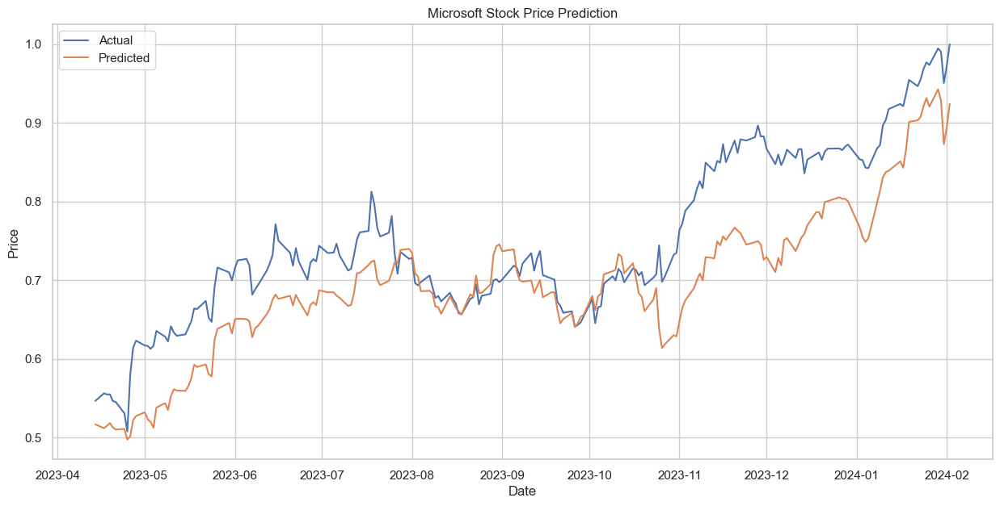

In [40]:
#使用rnn预测，将其他股票价格作为预测因子预测微软股票价格
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import SimpleRNN, Dense
from keras.optimizers import Adam

#将数据集标准化
scaler = MinMaxScaler()
standard_pridictors = pd.DataFrame(scaler.fit_transform(pridictors), columns=pridictors.columns, index=pridictors.index)

#将数据集分为训练集和测试集
train, test = train_test_split(standard_pridictors, test_size=0.2, shuffle=False)

#将数据集分为特征和标签
X_train = train.drop('Microsoft_Price', axis=1)
y_train = train['Microsoft_Price']
X_test = test.drop('Microsoft_Price', axis=1)
y_test = test['Microsoft_Price']

#将数据集转换为rnn输入格式
X_train = X_train.values.reshape(X_train.shape[0], 1, X_train.shape[1])
X_test = X_test.values.reshape(X_test.shape[0], 1, X_test.shape[1])

#创建rnn模型
model = Sequential()
model.add(SimpleRNN(50, activation='relu', input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(Dense(1))
model.compile(optimizer=Adam(learning_rate=0.01), loss='mean_squared_error')
model.summary()

#拟合模型
model.fit(X_train, y_train, epochs=100, batch_size=32, verbose=1)

#预测
y_pred = model.predict(X_test)

#计算评估指标
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')
r2 = r2_score(y_test, y_pred)
print(f'R2 Score: {r2}')

#绘制预测结果
plt.figure(figsize=(15, 7))

plt.plot(test.index, y_test, label='Actual')
plt.plot(test.index, y_pred, label='Predicted')

plt.title('Microsoft Stock Price Prediction')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

In [41]:
#将rnn的预测结果写入csv文件
rnn_pred = pd.DataFrame({'Date': test.index, 'Actual': y_test, 'rnn_Predicted': y_pred.flatten()})
rnn_pred.to_csv('rnn_pred.csv', index=False)


In [42]:
#综合对比一下各种模型的预测结果
lstm_pred = pd.read_csv('lstm_pred.csv')
knn_pred = pd.read_csv('knn_pred.csv')
cnn_pred = pd.read_csv('cnn_pred.csv')
rnn_pred = pd.read_csv('rnn_pred.csv')
xgboost_pred = pd.read_csv('xgboost_result.csv')


#将各种模型的预测结果合并
combined_pred = pd.merge(lstm_pred, knn_pred, on='Date')
combined_pred = pd.merge(combined_pred, cnn_pred, on='Date')
combined_pred = pd.merge(combined_pred, rnn_pred, on='Date')


#drop多余的列
combined_pred.drop(['Actual_y'], axis=1, inplace=True)
combined_pred.drop(['Actual_x'], axis=1, inplace=True)
combined_pred['Xgboost_Predicted'] = xgboost_pred['Predicted_Microsoft_Price']
combined_pred['Actual'] = xgboost_pred['Microsoft_Price']

combined_pred.head()


C:\Windows\Temp\ipykernel_60104\3200162851.py:12: FutureWarning: Passing 'suffixes' which cause duplicate columns {'Actual_x'} in the result is deprecated and will raise a MergeError in a future version.
  combined_pred = pd.merge(combined_pred, rnn_pred, on='Date')


,Date,lstm_Predicted,knn_Predicted,cnn_Predicted,rnn_Predicted,Xgboost_Predicted,Actual
0,2023-04-14,0.548248,0.067254,0.544603,0.516572,0.542690,0.546483
1,2023-04-17,0.542805,0.058173,0.539742,0.511667,0.537565,0.556128
2,2023-04-18,0.545560,0.072396,0.540078,0.514869,0.540991,0.554569
3,2023-04-19,0.548243,0.076133,0.541398,0.518083,0.544135,0.554859
4,2023-04-20,0.542409,0.055487,0.537487,0.512814,0.537602,0.546374


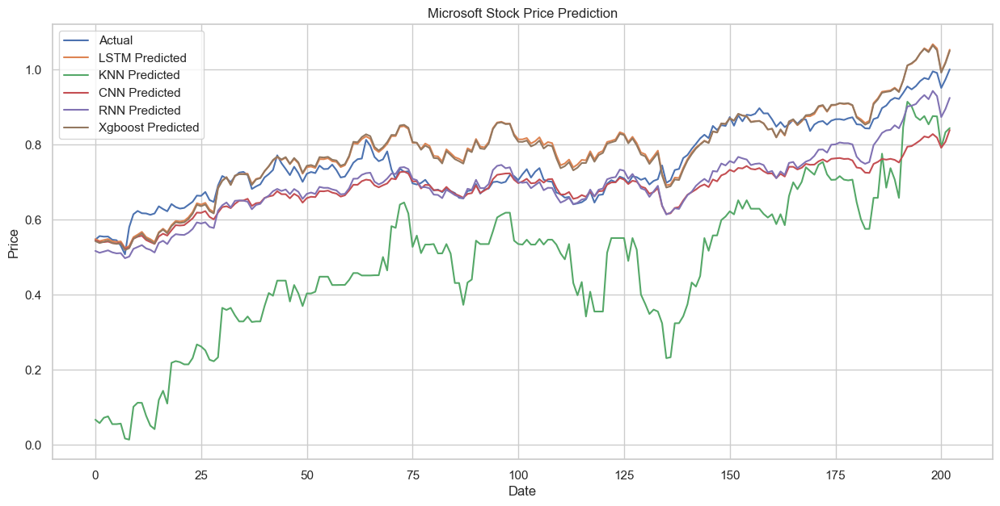

In [43]:
#绘制对比各种模型的预测结果
plt.figure(figsize=(15, 7))

plt.plot(combined_pred.index, combined_pred['Actual'], label='Actual')
plt.plot(combined_pred.index, combined_pred['lstm_Predicted'], label='LSTM Predicted')
plt.plot(combined_pred.index, combined_pred['knn_Predicted'], label='KNN Predicted')
plt.plot(combined_pred.index, combined_pred['cnn_Predicted'], label='CNN Predicted')
plt.plot(combined_pred.index, combined_pred['rnn_Predicted'], label='RNN Predicted')
plt.plot(combined_pred.index, combined_pred['Xgboost_Predicted'], label='Xgboost Predicted')

plt.title('Microsoft Stock Price Prediction')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()


In [44]:
#将各个模型的评估指标放在一张表中进行对比
actual = combined_pred['Actual']
lstm_pred = combined_pred['lstm_Predicted']
knn_pred = combined_pred['knn_Predicted']
cnn_pred = combined_pred['cnn_Predicted']
rnn_pred = combined_pred['rnn_Predicted']
xgboost_pred = combined_pred['Xgboost_Predicted']

mse_lstm = mean_squared_error(actual, lstm_pred)
r2_lstm = r2_score(actual, lstm_pred)

mse_knn = mean_squared_error(actual, knn_pred)
r2_knn = r2_score(actual, knn_pred)

mse_cnn = mean_squared_error(actual, cnn_pred)
r2_cnn = r2_score(actual, cnn_pred)

mse_rnn = mean_squared_error(actual, rnn_pred)
r2_rnn = r2_score(actual, rnn_pred)

mse_xgboost = mean_squared_error(actual, xgboost_pred)
r2_xgboost = r2_score(actual, xgboost_pred)

evaluation = pd.DataFrame({'Model': ['LSTM', 'KNN', 'CNN', 'RNN', 'Xgboost'],
                            'Mean Squared Error': [mse_lstm, mse_knn, mse_cnn, mse_rnn, mse_xgboost],
                            'R2 Score': [r2_lstm, r2_knn, r2_cnn, r2_rnn, r2_xgboost]})
evaluation

,Model,Mean Squared Error,R2 Score
0,LSTM,0.004328,0.597315
1,KNN,0.087313,-7.123936
2,CNN,0.007316,0.319321
3,RNN,0.004817,0.551776
4,Xgboost,0.004114,0.617216


In [45]:
pridictors

,Microsoft_Price,Apple_Price,Nasdaq_100_Price,Nvidia_Price,Google_Price,Berkshire_Price,S&P_500_Price
Date,,,,,,,
2020-01-02,160.62,75.09,8872.22,59.98,68.43,342261.0,3257.85
2020-01-03,158.62,74.36,8793.90,59.02,68.08,339155.0,3234.85
2020-01-06,159.03,74.95,8848.51,59.27,69.89,340210.0,3246.28
2020-01-07,157.58,74.60,8846.45,59.98,69.76,338901.0,3237.18
2020-01-08,160.09,75.80,8912.37,60.09,70.25,339188.0,3253.05
...,...,...,...,...,...,...,...
2024-01-29,409.72,191.73,17596.27,624.65,153.51,578800.0,4927.93
2024-01-30,408.59,188.04,17476.71,627.74,151.46,584680.0,4924.97
2024-01-31,397.58,184.40,17137.24,615.27,140.10,578020.0,4848.87


### arima的预测效果太差了

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=2.31 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=5359.152, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=5160.943, Time=0.17 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=1.37 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=5358.536, Time=0.04 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=5057.933, Time=0.45 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=5.20 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=2.31 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=5064.107, Time=0.33 sec
 ARIMA(2,1,0)(2,1,0)[12]             : AIC=5059.931, Time=0.61 sec
 ARIMA(1,1,1)(2,1,0)[12]             : AIC=inf, Time=5.43 sec
 ARIMA(0,1,1)(2,1,0)[12]             : AIC=5057.924, Time=0.44 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=5161.018, Time=0.17 sec
 ARIMA(0,1,1)(2,1,1)[12]             : AIC=inf, Time=5.35 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=inf, T

c:\Users\白瑞\AppData\Local\Programs\Python\Python311\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\白瑞\AppData\Local\Programs\Python\Python311\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


Mean Squared Error: 6604.113250463845
R2 Score: -7.078166205080677


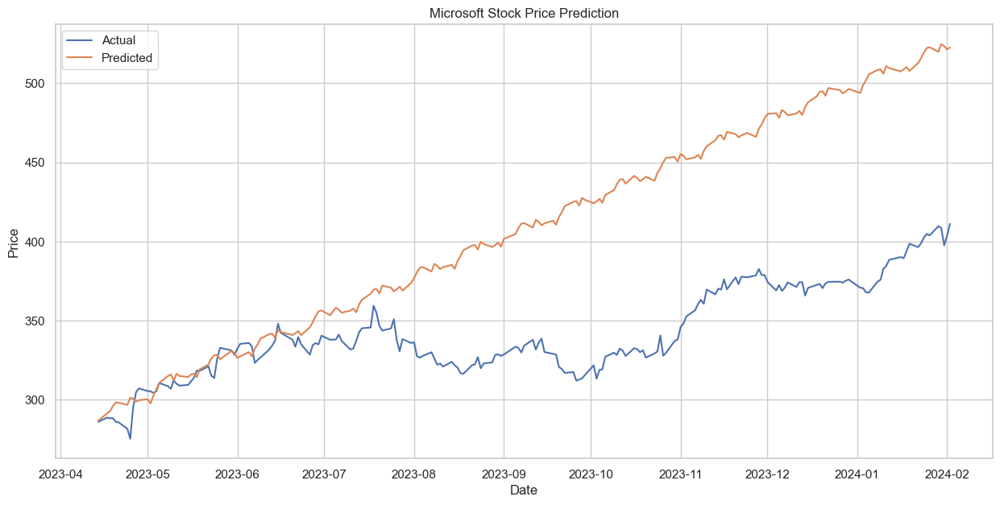

In [46]:
#使用arima模型预测微软股票价格
from statsmodels.tsa.arima.model import ARIMA
from pmdarima import auto_arima
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.preprocessing import MinMaxScaler
import pandas as pd
import matplotlib.pyplot as plt

#读取数据
data = pridictors

#将数据集分为训练集和测试集
train, test = train_test_split(data, test_size=0.2, shuffle=False)

#创建arima模型
model = auto_arima(train['Microsoft_Price'], start_p=1, start_q=1, max_p=5, max_q=5, m=12, start_P=0, seasonal=True, d=1, D=1, trace=True, error_action='ignore', suppress_warnings=True, stepwise=True)

#拟合模型
model.fit(train['Microsoft_Price'])

#预测
y_pred = model.predict(n_periods=len(test))

#计算评估指标
mse = mean_squared_error(test['Microsoft_Price'], y_pred)
print(f'Mean Squared Error: {mse}')
r2 = r2_score(test['Microsoft_Price'], y_pred)
print(f'R2 Score: {r2}')

#绘制预测结果
plt.figure(figsize=(15, 7))

plt.plot(test.index, test['Microsoft_Price'], label='Actual')
plt.plot(test.index, y_pred, label='Predicted')

plt.title('Microsoft Stock Price Prediction')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()


c:\Users\白瑞\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_1 (LSTM)                   │ (None, 50)             │        11,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 1)              │            51 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,451 (44.73 KB)

 Trainable params: 11,451 (44.73 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0637 - root_mean_squared_error: 0.2415 - val_loss: 0.0130 - val_root_mean_squared_error: 0.1076
Epoch 2/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0030 - root_mean_squared_error: 0.0545 - val_loss: 0.0033 - val_root_mean_squared_error: 0.0567
Epoch 3/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0015 - root_mean_squared_error: 0.0384 - val_loss: 0.0035 - val_root_mean_squared_error: 0.0601
Epoch 4/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 9.8621e-04 - root_mean_squared_error: 0.0314 - val_loss: 0.0024 - val_root_mean_squared_error: 0.0512
Epoch 5/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 9.7577e-04 - root_mean_squared_error: 0.0312 - val_loss: 0.0030 - val_root_mean_squared_error: 0.0571
Epoch 6/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 9.9655e-04 - root_mean_squared_error: 0.0315 - val_loss: 0.0025 - val_root_mean_squared_error: 0.0525
Epoch 7/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms

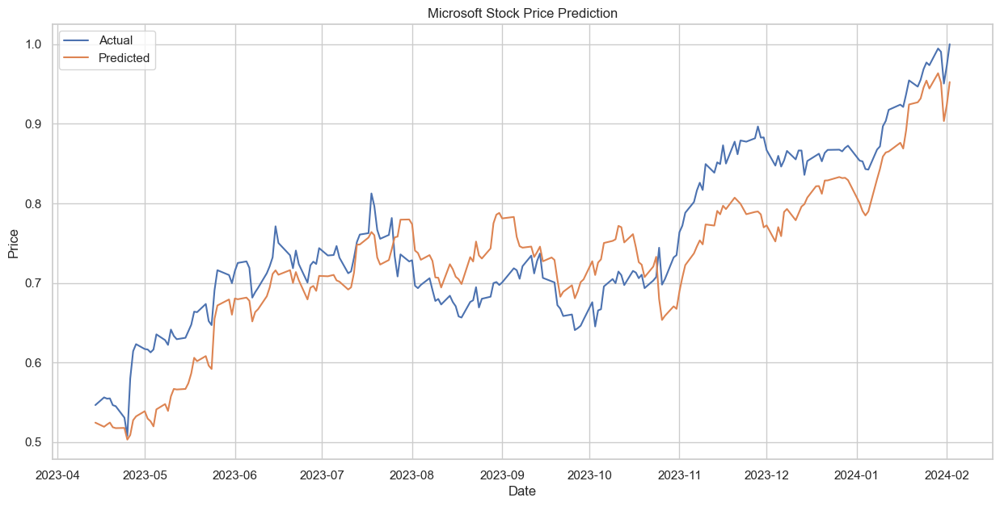

In [47]:
#使用lstm预测，将其他股票价格作为预测因子预测微软股票价格
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import Dense, LSTM
from keras.optimizers import Adam
from keras.losses import MeanSquaredError
from keras.metrics import RootMeanSquaredError
from keras.callbacks import EarlyStopping

#将数据集标准化
scaler = MinMaxScaler()
standard_pridictors = pd.DataFrame(scaler.fit_transform(pridictors), columns=pridictors.columns, index=pridictors.index)

#将数据集分为训练集和测试集
train, test = train_test_split(standard_pridictors, test_size=0.2, shuffle=False)

#将数据集分为特征和标签
X_train = train.drop('Microsoft_Price', axis=1)
y_train = train['Microsoft_Price']
X_test = test.drop('Microsoft_Price', axis=1)
y_test = test['Microsoft_Price']

#将数据集转换为lstm输入格式
X_train = X_train.values.reshape(X_train.shape[0], 1, X_train.shape[1])
X_test = X_test.values.reshape(X_test.shape[0], 1, X_test.shape[1])

#创建lstm模型
model = Sequential()
model.add(LSTM(50, activation='relu', input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(Dense(1))
model.compile(optimizer=Adam(learning_rate=0.01), loss=MeanSquaredError(), metrics=[RootMeanSquaredError()])
model.summary()

#拟合模型
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test), callbacks=[EarlyStopping(patience=10)], verbose=1)

#预测
y_pred = model.predict(X_test)

#计算评估指标
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')
r2 = r2_score(y_test, y_pred)
print(f'R2 Score: {r2}')

#绘制预测结果
plt.figure(figsize=(15, 7))

plt.plot(test.index, y_test, label='Actual')
plt.plot(test.index, y_pred, label='Predicted')

plt.title('Microsoft Stock Price Prediction')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()


In [48]:
# Predict the next 30 days of stock prices
future_prices = []
current_features = X_test[-1]

for i in range(5):
    # Reshape for the model prediction
    current_features_reshaped = current_features.reshape(1, -1, 6)
    # Predict the future price
    future_price = model.predict(current_features_reshaped)[0][0]
    # Append the predicted price to the future_prices list
    future_prices.append(future_price)
    # Update the current_features to include the predicted price
    current_features = np.roll(current_features, -1)  # Shift the window
    current_features[-1] = future_price  # Add the predicted price at the end

future_prices

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


[0.9523735, 0.9499001, 0.9474541, 0.9450369, 0.94264984]

In [49]:
#将预测结果转化为dataframe
future_prices_df = pd.DataFrame(future_prices, columns=['Predicted_Price'])
future_prices_df.index = pd.date_range(start=pridictors.index[-1], periods=5, freq='D')
future_prices_df.index.name = 'Date'
future_prices_df


,Predicted_Price
Date,
2024-02-02,0.952374
2024-02-03,0.949900
2024-02-04,0.947454
2024-02-05,0.945037
2024-02-06,0.942650


In [50]:
pridictors['Microsoft_Price'].tail(30)

Date
2023-12-20    370.62
2023-12-21    373.54
2023-12-22    374.58
2023-12-26    374.66
2023-12-27    374.07
2023-12-28    375.28
2023-12-29    376.04
2024-01-02    370.87
2024-01-03    370.60
2024-01-04    367.94
2024-01-05    367.75
2024-01-08    374.69
2024-01-09    375.79
2024-01-10    382.77
2024-01-11    384.63
2024-01-12    388.47
2024-01-16    390.27
2024-01-17    389.47
2024-01-18    393.87
2024-01-19    398.67
2024-01-22    396.51
2024-01-23    398.90
2024-01-24    402.56
2024-01-25    404.87
2024-01-26    403.93
2024-01-29    409.72
2024-01-30    408.59
2024-01-31    397.58
2024-02-01    403.78
2024-02-02    411.22
Name: Microsoft_Price, dtype: float64

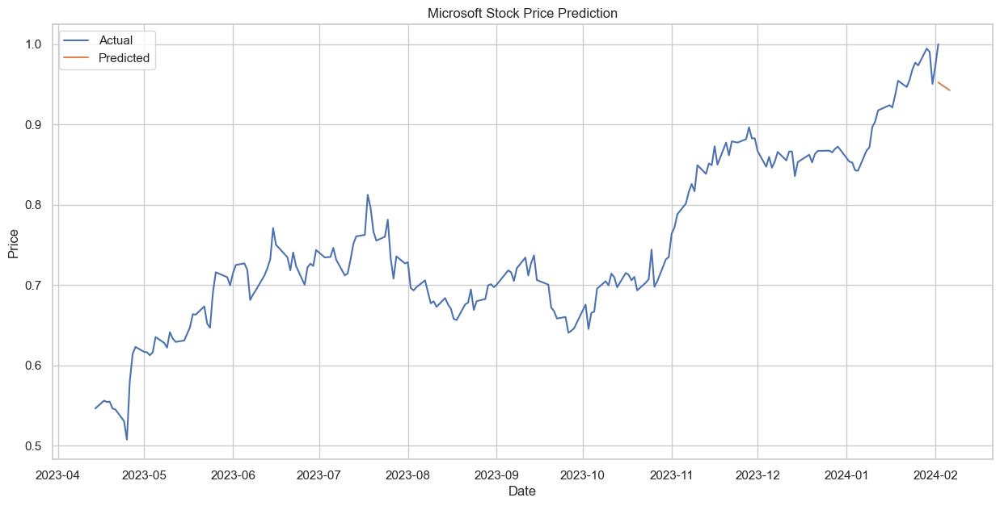

In [51]:
#绘制预测结果
plt.figure(figsize=(15, 7))

plt.plot(y_test, label='Actual')
plt.plot(future_prices_df, label='Predicted')

plt.title('Microsoft Stock Price Prediction')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

In [52]:
pridictors.head()

,Microsoft_Price,Apple_Price,Nasdaq_100_Price,Nvidia_Price,Google_Price,Berkshire_Price,S&P_500_Price
Date,,,,,,,
2020-01-02,160.62,75.09,8872.22,59.98,68.43,342261.0,3257.85
2020-01-03,158.62,74.36,8793.90,59.02,68.08,339155.0,3234.85
2020-01-06,159.03,74.95,8848.51,59.27,69.89,340210.0,3246.28
2020-01-07,157.58,74.60,8846.45,59.98,69.76,338901.0,3237.18
2020-01-08,160.09,75.80,8912.37,60.09,70.25,339188.0,3253.05


### 考虑使用多元线性回归预测，将RNN和XGboost作为基层输出到线性回归模型进行堆叠

In [53]:
#考虑使用多元线性回归预测，将RNN和XGboost作为基层输出到线性回归模型进行堆叠

#将数据集分为训练集和测试集
train, test = train_test_split(pridictors, test_size=0.2, shuffle=False)

#将数据集分为特征和标签
X_train = train.drop('Microsoft_Price', axis=1)
y_train = train['Microsoft_Price']
X_test = test.drop('Microsoft_Price', axis=1)
y_test = test['Microsoft_Price']

#lstm模型
lstm_model = Sequential()
lstm_model.add(LSTM(50, activation='relu', input_shape=(X_train.shape[1], 1)))
lstm_model.add(Dense(1))
lstm_model.compile(optimizer=Adam(learning_rate=0.01), loss=MeanSquaredError(), metrics=[RootMeanSquaredError()])
lstm_model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test), callbacks=[EarlyStopping(patience=10)], verbose=1)
lstm_pred = lstm_model.predict(X_test)
#打印lstm模型的评估指标
mse = mean_squared_error(y_test, lstm_pred)
print(f'Mean Squared Error of lstm: {mse}')
r2 = r2_score(y_test, lstm_pred)
print(f'R2 Score of lstm: {r2}')


#rnn模型
rnn_model = Sequential()
rnn_model.add(LSTM(50, activation='relu', input_shape=(X_train.shape[1], 1)))
rnn_model.add(Dense(1))
rnn_model.compile(optimizer=Adam(learning_rate=0.01), loss=MeanSquaredError(), metrics=[RootMeanSquaredError()])
rnn_model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test), callbacks=[EarlyStopping(patience=10)], verbose=1)
rnn_pred = rnn_model.predict(X_test)

#打印rnn模型的评估指标
mse = mean_squared_error(y_test, rnn_pred)
print(f'Mean Squared Error of rnn: {mse}')
r2 = r2_score(y_test, rnn_pred)
print(f'R2 Score of rnn: {r2}')


Epoch 1/100


c:\Users\白瑞\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 249949120.0000 - root_mean_squared_error: 15224.7559 - val_loss: 711320.1875 - val_root_mean_squared_error: 837.0413
Epoch 2/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3971037.7500 - root_mean_squared_error: 1932.1515 - val_loss: 128850.4219 - val_root_mean_squared_error: 357.2247
Epoch 3/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 230452.4531 - root_mean_squared_error: 468.6295 - val_loss: 6004.2856 - val_root_mean_squared_error: 78.2640
Epoch 4/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 18309.9922 - root_mean_squared_error: 133.1331 - val_loss: 5060.2773 - val_root_mean_squared_error: 69.0854
Epoch 5/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2151.6047 - root_mean_squared_error: 45.6917 - val_loss: 7249.5474 - val_root_mean_squared_error: 82.9696
Epoch 6/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 605.9698 - root_mean_squared_error: 24.5589 - val_loss: 3559.8169 - val_root_mean_squared_error: 57.705

c:\Users\白瑞\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\layers\rnn\rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 89325032.0000 - root_mean_squared_error: 9175.9756 - val_loss: 107382992.0000 - val_root_mean_squared_error: 10274.8330
Epoch 2/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 27999468.0000 - root_mean_squared_error: 5162.4272 - val_loss: 717175.8125 - val_root_mean_squared_error: 839.3770
Epoch 3/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 131236.8906 - root_mean_squared_error: 345.5678 - val_loss: 46947.3789 - val_root_mean_squared_error: 211.2404
Epoch 4/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6024.0088 - root_mean_squared_error: 75.9797 - val_loss: 696.2260 - val_root_mean_squared_error: 21.3097
Epoch 5/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1137.2853 - root_mean_squared_error: 33.5811 - val_loss: 6114.9648 - val_root_mean_squared_error: 73.4436
Epoch 6/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 804.1110 - root_mean_squared_error: 28.3415 - val_loss: 4167.4170 - val_root_mean_squared_error: 59.

In [54]:
#使用lstm和rnn的预测结果作为特征输入到线性回归模型
X_train = pd.DataFrame({'lstm': lstm_pred.flatten(), 'rnn': rnn_pred.flatten()})
y_train = y_test
X_test = pd.DataFrame({'lstm': lstm_pred.flatten(), 'rnn': rnn_pred.flatten()})
y_test = y_test

#创建线性回归模型
from sklearn.linear_model import LinearRegression
model = LinearRegression()
model.fit(X_train, y_train)

#预测
y_pred = model.predict(X_test)

#计算评估指标
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')
r2 = r2_score(y_test, y_pred)
print(f'R2 Score: {r2}')

Mean Squared Error: 169.2860841817168
R2 Score: 0.7929288804774604


In [55]:
#预测未来30天的股票价格
future_prices = []
current_features = X_test.iloc[-1]

for i in range(10):
    # Predict the future price
    future_price = model.predict([current_features])[0]
    # Append the predicted price to the future_prices list
    future_prices.append(future_price)
    # Update the current_features to include the predicted price
    current_features = current_features.shift(-1)  # Shift the window
    current_features[-1] = future_price  # Add the predicted price at the end

future_prices

c:\Users\白瑞\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
c:\Users\白瑞\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
c:\Users\白瑞\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
c:\Users\白瑞\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
c:\Users\白瑞\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but LinearRegression wa

[369.6561,
 431.9558,
 505.30783,
 591.67285,
 693.35944,
 813.08575,
 954.0521,
 1120.0266,
 1315.4458,
 1545.5334]

In [56]:
#将预测结果转化为dataframe
future_prices_df = pd.DataFrame(future_prices, columns=['Predicted_Price'])
future_prices_df.index = pd.date_range(start=pridictors.index[-1], periods=10, freq='D')
future_prices_df.index.name = 'Date'
future_prices_df

,Predicted_Price
Date,
2024-02-02,369.656097
2024-02-03,431.955811
2024-02-04,505.307831
2024-02-05,591.672852
2024-02-06,693.359436
2024-02-07,813.085754
2024-02-08,954.052124
2024-02-09,1120.026611
2024-02-10,1315.445801


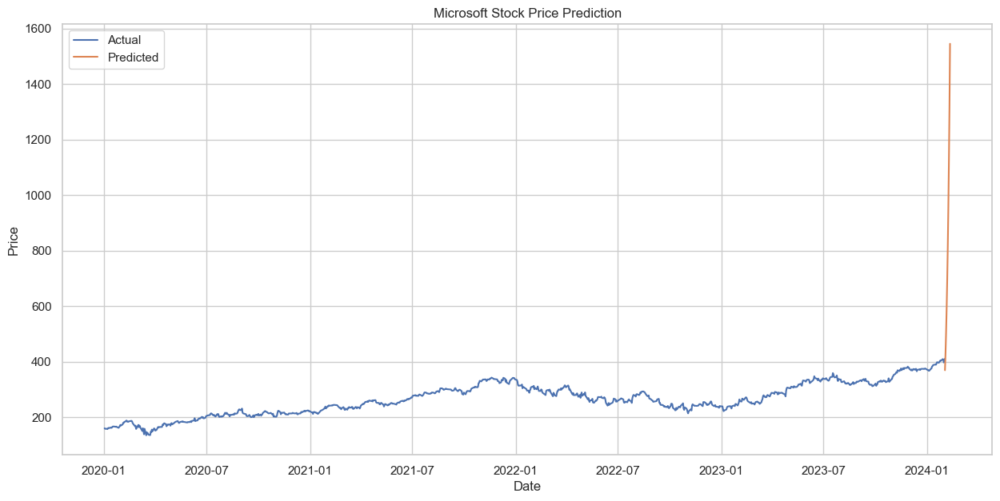

In [57]:
#绘制预测结果和实际结果
plt.figure(figsize=(15, 7))
plt.plot(pridictors['Microsoft_Price'], label='Actual')
plt.plot(future_prices_df, label='Predicted')
plt.title('Microsoft Stock Price Prediction')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

In [58]:
#单独使用多元线性回归模型预测未来30天的股票价格

#将数据集分为训练集和测试集

train, test = train_test_split(pridictors, test_size=0.2, shuffle=False)

#将数据集分为特征和标签
X_train = train.drop('Microsoft_Price', axis=1)
y_train = train['Microsoft_Price']
X_test = test.drop('Microsoft_Price', axis=1)
y_test = test['Microsoft_Price']

#创建线性回归模型
model = LinearRegression()
model.fit(X_train, y_train)

#预测
y_pred = model.predict(X_test)

#计算评估指标
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')
r2 = r2_score(y_test, y_pred)
print(f'R2 Score: {r2}')



Mean Squared Error: 234.30967392449227
R2 Score: 0.7133918790251872


In [66]:
#预测未来30天的股票价格
future_prices = []
current_features = X_test.iloc[-1]

for i in range(10):
    # Predict the future price
    future_price = model.predict([current_features])[0]
    # Append the predicted price to the future_prices list
    future_prices.append(future_price)
    # Update the current_features to include the predicted price
    current_features = current_features.shift(-1)  # Shift the window
    current_features[-1] = future_price  # Add the predicted price at the end

future_prices

c:\Users\白瑞\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
c:\Users\白瑞\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
c:\Users\白瑞\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
c:\Users\白瑞\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
c:\Users\白瑞\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:420: UserWarning: X does not have valid feature names, but LinearRegression wa

[410.06597066891544,
 527983.7770028606,
 171972.3706215747,
 3240.388105993479,
 746963.6622965273,
 310767.4413442704,
 53228.396281322086,
 911726.5651622897,
 574115.4419350745,
 140467.40371373872]

In [64]:
#将预测结果转化为dataframe
future_prices_df = pd.DataFrame(future_prices, columns=['Predicted_Price'])
future_prices_df.index = pd.date_range(start=pridictors.index[-1], periods=10, freq='D')
future_prices_df.index.name = 'Date'
future_prices_df

,Predicted_Price
Date,
2024-02-02,410.065971
2024-02-03,527983.777003
2024-02-04,171972.370622
2024-02-05,3240.388106
2024-02-06,746963.662297
2024-02-07,310767.441344
2024-02-08,53228.396281
2024-02-09,911726.565162
2024-02-10,574115.441935


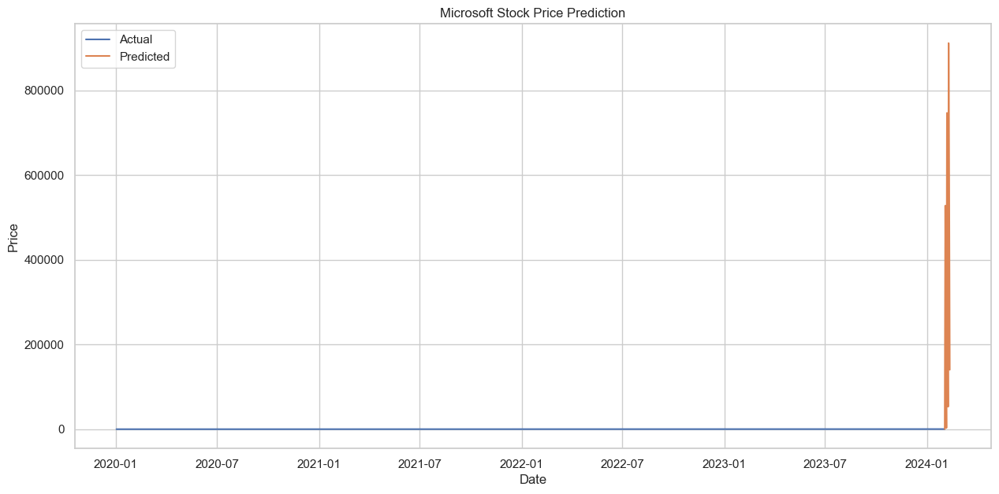

In [67]:
#绘制预测结果和实际结果
plt.figure(figsize=(15, 7))
plt.plot(pridictors['Microsoft_Price'], label='Actual')
plt.plot(future_prices_df, label='Predicted')

plt.title('Microsoft Stock Price Prediction')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()